1. Lectura de base:
Tomamos la base que publica Properati con el detalle de las propiedades publicadas para venta o alquiler del siguiente sitio:
https://storage.googleapis.com/properati-data-public/ar_properties.csv.gz

2. Limpieza y transformacion de la base:
2.a 
Partimos de 1 milón de datos y realizamos las siguientes transformaciones:
*   Filtramos las publicaciones de Argentina (983.764)
*   Filtramos las publicaciones de CABA ( 253.265)
*   Filtramos unicamente propiedades en venta (182.060)
*   Filtramos unicamente departamentos (111.576)
*   Filtramos unicamente deptos entre 1 y 3 ambientes (83.270)
*   Eliminamos registros sin precio publicado (81.034)
*   Eliminamos registros sin el dato de cantidad de m2 de la propiedad (62.473)
*   Filtramos unicamente propiedades con precios en dolares (61.751)
*   Calculamos el precio del m2 como Precio/Superficie cubierta 
*   Renombramos Columnas
*   Filtramos los datos con informacion de la latitud y longitud de la propiedad (57.717)


2.b Calculamos la distancia de cada propiedad a la estacion de subte mas cercana y adicionalmente generamos una columna con el nombre de la estacion mas cercana

2.c Para evitar demoras en el procesamiento de datos, trabajamos unicamente con las publicaciones del 1Q2020 (13.430) y eliminamos las publicaciones duplicadas (11.878)

2.d Transformamos los siguientes datos:

*   Renombramos los barrios para llamarlos de la misma forma que figuran en la base de "Barrios" del gobierno de la ciudad
*   Transformacion de outliers (percentiles 2 y 95)

3. Visualizacion de la informacion 
 - Base properati por barrios
 - Datos del gobierno de la ciudad de Subtes/EcoBicis/Metrobus/Trenes

4. Analisis de Correlacion










In [ ]:
from bs4 import BeautifulSoup
from requests import get
from time import sleep
from random import randint
import pandas as pd
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

### **1. Lectura de base Properati**

In [ ]:
df = pd.read_csv('https://storage.googleapis.com/properati-data-public/ar_properties.csv.gz', compression='gzip', header=0, sep=',', error_bad_lines=False)

In [ ]:
df = pd.read_csv('https://storage.googleapis.com/properati-data-public/ar_properties.csv.gz', compression='gzip', header=0, sep=',', error_bad_lines=False)

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

In [ ]:
df.head()

,id,ad_type,start_date,end_date,created_on,lat,lon,l1,l2,l3,l4,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description,property_type,operation_type
0,JWGTNKafLXCgOFDURSP5QQ==,Propiedad,2020-11-22,2020-12-03,2020-11-22,-34.633760,-58.454463,Argentina,Capital Federal,Flores,NaN,NaN,NaN,3.0,NaN,2.0,NaN,NaN,183000.0,USD,NaN,"Departamento PH en Venta ubicado en Flores, C...","Muy lindo PH de primer piso al frente, ampliuo...",PH,Venta
1,BTmnUiQ/plMdlGOZaVP0iw==,Propiedad,2020-11-22,2020-12-02,2020-11-22,-31.413500,-64.181050,Argentina,Córdoba,Córdoba,NaN,NaN,NaN,2.0,NaN,1.0,37.0,37.0,30100.0,USD,NaN,PH APTO PROFESIONAL 37m2,Corredor Responsable: Juan Manuel Quiroga - CP...,PH,Venta
2,NOWN14RDBdGsHGXNh8I4Zg==,Propiedad,2020-11-22,9999-12-31,2020-11-22,-34.671041,-58.499493,Argentina,Capital Federal,Mataderos,NaN,NaN,NaN,3.0,NaN,1.0,NaN,NaN,115000.0,USD,NaN,Departamento PH en Venta ubicado en Mataderos...,"COMODO PH en 1º piso , buen estado, tiene 2 d...",PH,Venta
3,lDrpWzjNHnEHTVTv3DUdMQ==,Propiedad,2020-11-22,9999-12-31,2020-11-22,-34.641862,-58.510752,Argentina,Capital Federal,Villa Luro,NaN,NaN,NaN,5.0,NaN,2.0,NaN,NaN,165000.0,USD,NaN,Departamento PH en Venta ubicado en Villa Lur...,"Tipo Casa muy comodo (apto 2 familias), se des...",PH,Venta
4,6Ahaz+K8CbOVuzT/EuLEZg==,Propiedad,2020-11-22,9999-12-31,2020-11-22,-34.642499,-58.502548,Argentina,Capital Federal,Villa Luro,NaN,NaN,NaN,3.0,NaN,1.0,NaN,NaN,159000.0,USD,NaN,Departamento PH en Venta ubicado en Villa Lur...,"Excelente PH en contrafrente, edificio chico, ...",PH,Venta


In [ ]:
df.shape

(1000000, 25)

In [ ]:
df_arg=df.loc[df.l1=="Argentina",:]

In [ ]:
df_arg.shape

(986228, 25)

In [ ]:
df_arg.l2.unique()

array(['Capital Federal', 'Córdoba', 'Bs.As. G.B.A. Zona Norte',
       'Bs.As. G.B.A. Zona Oeste', 'Salta',
       'Buenos Aires Costa Atlántica', 'Bs.As. G.B.A. Zona Sur',
       'Río Negro', 'Santa Fe', 'Buenos Aires Interior', 'Misiones',
       'Neuquén', 'Mendoza', 'Entre Ríos', 'Chaco', 'Catamarca',
       'La Pampa', 'Tucumán', 'Corrientes', 'Santa Cruz', 'La Rioja',
       'San Luis', 'Jujuy', 'San Juan', 'Chubut', 'Formosa',
       'Tierra Del Fuego', 'Santiago Del Estero'], dtype=object)

In [ ]:
df_caba=df_arg.loc[df_arg.l2=="Capital Federal",:]
df_caba.shape

(239250, 25)

In [ ]:
df_caba.operation_type.unique()

array(['Venta', 'Alquiler', 'Alquiler temporal'], dtype=object)

In [ ]:
df_caba=df_caba.loc[df_caba.operation_type=="Venta",:]

In [ ]:
df_caba.shape

(172750, 25)

In [ ]:
df_caba.property_type.unique()

array(['PH', 'Casa', 'Lote', 'Departamento', 'Local comercial', 'Cochera',
       'Oficina', 'Depósito', 'Otro', 'Casa de campo'], dtype=object)

In [ ]:
df_caba=df_caba.loc[df_caba.property_type=="Departamento",:]
df_caba.shape

(107296, 25)

In [ ]:
df_caba.rooms.unique()

array([nan,  2.,  1.,  4.,  3.,  5.,  6.,  7.,  9.,  8., 10., 12., 15.,
       14., 20., 22., 11., 21.])

In [ ]:
df_caba.rooms.value_counts()

2.0     30759
3.0     27140
1.0     23110
4.0     14978
5.0      3579
6.0      1113
7.0       423
8.0       192
9.0       101
10.0       33
12.0       20
14.0        5
11.0        3
20.0        2
15.0        2
22.0        1
21.0        1
Name: rooms, dtype: int64

In [ ]:
df_caba.loc[df.rooms.isna(),:]

,id,ad_type,start_date,end_date,created_on,lat,lon,l1,l2,l3,l4,l5,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price,currency,price_period,title,description,property_type,operation_type
128,suVO4z5JQDS1ZfKblUZvtg==,Propiedad,2020-11-22,9999-12-31,2020-11-22,-34.554474,-58.463993,Argentina,Capital Federal,Nuñez,NaN,NaN,NaN,NaN,NaN,1.0,38.0,36.0,123000.0,USD,NaN,Av Cabildo 3000 1° - U$D 123.000 - Departame...,"Excelente departamento sobre Av Cabildo, apto ...",Departamento,Venta
133,8ICECRvTQxG6CYF6ThtQ/Q==,Propiedad,2020-11-22,9999-12-31,2020-11-22,-34.635560,-58.371556,Argentina,Capital Federal,Barracas,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,45000.0,USD,NaN,"Departamento en Venta ubicado en Barracas, Ca...","Monoambiente ideal para renta, a metros de Ave...",Departamento,Venta
152,BwT8asPYSlEhki1K1l1PVQ==,Propiedad,2020-11-22,9999-12-31,2020-11-22,-34.592857,-58.445042,Argentina,Capital Federal,Villa Crespo,NaN,NaN,NaN,NaN,NaN,1.0,39.0,34.0,69700.0,USD,NaN,Humboldt 600 1a10 - U$D 69.700 - Departamento...,Amplio monoambiente apto profesional. La unida...,Departamento,Venta
155,uQMyIsjpQpJBOBt+jScw+A==,Propiedad,2020-11-22,9999-12-31,2020-11-22,-34.592857,-58.445042,Argentina,Capital Federal,Villa Crespo,NaN,NaN,NaN,NaN,NaN,1.0,34.0,29.0,62000.0,USD,NaN,Humboldt 600 1a10 - U$D 62.000 - Departamento...,Amplio monoambiente apto profesional. La unida...,Departamento,Venta
1139,6AeMjgkqKq7jJI5txGyX7Q==,Propiedad,2021-01-03,2021-03-04,2021-01-03,-34.566266,-58.487928,Argentina,Capital Federal,Villa Urquiza,NaN,NaN,NaN,NaN,1.0,1.0,53.0,40.0,84000.0,USD,NaN,"2 ambientes, balcón corrido, baulera INICIO DE...","Unidad Funcional 1° Piso A : 2 Ambientes, Livi...",Departamento,Venta
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992598,+FyQ1KGhnI7h1BVPkIsbcw==,Propiedad,2020-01-08,2020-02-19,2020-01-08,-34.644079,-58.484834,Argentina,Capital Federal,Parque Avellaneda,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,112000.0,USD,NaN,4 AMB AL FRENTE,DEPARTAMENTO EN EL BARRIO ALVEAR PISO 4° TODO ...,Departamento,Venta
992624,owNNzVGTDIKpd0a0Hw/zZA==,Propiedad,2020-01-08,2020-04-27,2020-01-08,-34.583015,-58.496415,Argentina,Capital Federal,Villa Pueyrredón,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,130000.0,USD,NaN,"AMPLIO 2 AMB A ESTRENAR, EDIFICIO DE CALIDAD, ...","EXCEPCIONAL DEPARTAMENTO DE 54 m2 TOTALES, AL ...",Departamento,Venta
993882,y/iE3oz0qXmBp9i2PlYtnQ==,Propiedad,2020-03-20,2020-05-23,2020-03-20,-34.576378,-58.485374,Argentina,Capital Federal,Villa Urquiza,NaN,NaN,NaN,NaN,NaN,NaN,85.0,80.0,260000.0,USD,NaN,Olazabal 5000 6° - U$D 260.000 - Departament...,"DEPARTAMENTO DE 3 AMBIENTES CON DEPENDENCIAS, ...",Departamento,Venta
995059,pkSc1bj0ixunjYS31KLs0A==,Propiedad,2020-03-20,2020-09-17,2020-03-20,-34.621746,-58.471840,Argentina,Capital Federal,Flores,NaN,NaN,NaN,NaN,NaN,1.0,143.0,33.0,88900.0,USD,NaN,Paez 2700 2° - U$D 88.900 - Departamento en ...,"PAEZ 2786 2° ""B"" (con ascensor) entre Terr...",Departamento,Venta


In [ ]:
df_caba=df_caba.loc[df_caba.rooms.isin([1, 2, 3]),:]

In [ ]:
df_caba.shape

(81009, 25)

In [ ]:
df_caba.describe()

,lat,lon,l6,rooms,bedrooms,bathrooms,surface_total,surface_covered,price
count,74235.000000,74189.000000,0.0,81009.000000,62693.000000,77281.000000,57453.000000,57933.000000,7.924200e+04
mean,-34.573813,-58.480914,NaN,2.049748,1.357488,1.237148,79.740588,65.463432,2.207791e+05
std,0.421926,0.531165,NaN,0.786024,0.616843,0.508810,868.098019,615.910331,8.640924e+05
min,-53.788624,-81.807577,NaN,1.000000,-1.000000,1.000000,10.000000,1.000000,0.000000e+00
25%,-34.613313,-58.461322,NaN,1.000000,1.000000,1.000000,40.000000,37.000000,9.300000e+04
50%,-34.597431,-58.437252,NaN,2.000000,1.000000,1.000000,52.000000,47.000000,1.298100e+05
75%,-34.579326,-58.412711,NaN,3.000000,2.000000,1.000000,72.000000,63.000000,1.890000e+05
max,26.217375,-5.490771,NaN,3.000000,22.000000,20.000000,140380.000000,67350.000000,4.471682e+07


In [ ]:
df_caba=df_caba.loc[~df.price.isna(),:]

In [ ]:
df_caba.shape

(79242, 25)

In [ ]:
df_caba=df_caba.loc[~df.surface_covered.isna(),:]
df_caba.shape

(56278, 25)

In [ ]:
df_caba.currency.value_counts()

USD    55908
ARS      239
Name: currency, dtype: int64

In [ ]:
df_caba=df_caba.loc[df_caba.currency=='USD',:]
df_caba.shape

(55908, 25)

In [ ]:
df_properati=df_caba

In [ ]:
df_properati.head()

In [ ]:
df_properati.to_csv('/content/drive/MyDrive/PDA - Trabajo Final/PDA - Trabajo Final/Properati/Properati-Eant/db_properati.csv')

Lo leo directamente del drive para evitar que se desconecte por superar el uso de RAM

In [ ]:
df_p=pd.read_csv('/content/drive/MyDrive/PDA - Trabajo Final/PDA - Trabajo Final/Properati/Properati-Eant/db_properati.csv')

In [ ]:
df_p['precio_m2']=round(df_p.price/df_p.surface_covered.astype(int),2)

In [ ]:
df_p.shape

(60947, 27)

In [ ]:
df_p['precio_m2']=round(df_p.price/df_p.surface_covered.astype(int),2)

In [ ]:
df_p.shape

(60947, 27)

Me quedo solo con las columnas que me interesan y renombro las columnas

In [ ]:
df_p.columns

Index(['Unnamed: 0', 'id', 'ad_type', 'start_date', 'end_date', 'created_on',
       'lat', 'lon', 'l1', 'l2', 'l3', 'l4', 'l5', 'l6', 'rooms', 'bedrooms',
       'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency',
       'price_period', 'title', 'description', 'property_type',
       'operation_type', 'precio_m2'],
      dtype='object')

In [ ]:
df_p.drop('Unnamed: 0', inplace=True, axis=1)

In [ ]:
df_p.drop('ad_type', inplace=True, axis=1)
df_p.drop('l4', inplace=True, axis=1)
df_p.drop('l5', inplace=True, axis=1)
df_p.drop('l6', inplace=True, axis=1)
df_p.drop('price_period', inplace=True, axis=1)

In [ ]:
df_p.columns

Index(['id', 'start_date', 'end_date', 'created_on', 'lat', 'lon', 'l1', 'l2',
       'l3', 'rooms', 'bedrooms', 'bathrooms', 'surface_total',
       'surface_covered', 'price', 'currency', 'title', 'description',
       'property_type', 'operation_type', 'precio_m2'],
      dtype='object')

In [ ]:
 df_p.columns=['id','start_date', 'end_date', 'created_on', 'lat', 'lon', 'Pais', 'Ciudad', 'Barrio',
       'ambientes', 'bedrooms', 'bathrooms', 'surface_total', 'surface_covered',
       'price', 'currency', 'title', 'description', 'property_type',
       'operation_type', 'precio_m2']

### **2.b.  Calculamos distancia al Subte**

In [ ]:
import geopy

In [ ]:
from geopy import distance

In [ ]:
from tqdm import tqdm

In [ ]:
subte=pd.read_excel('/content/drive/MyDrive/PDA - Trabajo Final/PDA - Trabajo Final/Properati/Properati-Eant/bocas-de-subte.xlsx')

In [ ]:
df_p.lat.isna().value_counts()

False    56949
True      3998
Name: lat, dtype: int64

In [ ]:
df_p.lon.isna().value_counts()

False    56949
True      3998
Name: lon, dtype: int64

In [ ]:
df_p=df_p.loc[~df_p["lat"].isna(),:]

In [ ]:
df_p=df_p.loc[~df_p["lon"].isna(),:]

In [ ]:
df_p.shape

(56949, 21)

In [ ]:
df_p=df_p.reset_index(drop=True)

In [ ]:
datos_propiedad=[]

propiedad_=[]
subte_=[]

distancias=[]
distancias_datos=[]

resultados=[]
resultados_datos=[]

for i in tqdm(list(range(df_p.shape[0]))):
    datos_propiedad.append(df_p["id"][i])
    propiedad_.append(float(df_p["lat"][i]))
    propiedad_.append(float(df_p["lon"][i]))
    
    for o in list(range(0,subte.shape[0])):
        subte_.append(float(subte.lat[o]))
        subte_.append(float(subte.long[o]))
        distancias_datos.append(subte.linea[o] + " - " +  subte.estacion[o])
    
        distancias.append(distance.distance(subte_, propiedad_).km)
        
        subte_.clear()
        
    index=distancias.index(min(distancias))
    
    resultados.append(distancias[index])
    resultados_datos.append(distancias_datos[index])          
        
    propiedad_.clear()
    distancias.clear()
    distancias_datos.clear()

In [ ]:
df_p["distancia_subte (km)"]=resultados

In [ ]:
df_p["estacion_subte"]=resultados_datos

In [ ]:
df_p.to_csv('properati_condistancias.csv')

## **2.c Base 1Q2020**

In [ ]:
import datetime

In [ ]:
import pandas as pd
import numpy as np
from bs4 import BeautifulSoup
from requests import get
from time import sleep
from random import randint

import itertools
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

In [ ]:
df= pd.read_csv('/content/drive/MyDrive/PDA - Trabajo Final/PDA - Trabajo Final/Properati/Properati-Eant/properati_condistancias.csv')

In [ ]:
df.columns

Index(['Unnamed: 0', 'id', 'start_date', 'end_date', 'created_on', 'lat',
       'lon', 'Pais', 'Ciudad', 'Barrio', 'ambientes', 'bedrooms', 'bathrooms',
       'surface_total', 'surface_covered', 'price', 'currency', 'title',
       'description', 'property_type', 'operation_type', 'precio_m2',
       'distancia_subte (km)', 'estacion_subte', 'geometry'],
      dtype='object')

In [ ]:
df['year_s'] = pd.DatetimeIndex(df['start_date']).year
df.head()

,Unnamed: 0,id,start_date,end_date,created_on,lat,lon,Pais,Ciudad,Barrio,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type,precio_m2,distancia_subte (km),estacion_subte,geometry,year_s
0,0,8o2zCCfifSCbK4R6z8g5Vw==,2020-09-26,2020-09-27,2020-09-26,-34.604538,-58.424956,Argentina,Capital Federal,Almagro,1.0,NaN,1.0,40.0,35.0,70397.0,USD,Departamento - Almagro Norte,Departamento monoambiente al contrafrente. Tou...,Departamento,Venta,2011.34,0.369213,B - ALMAGRO - MEDRANO,POINT (-58.4249555 -34.6045384),2020
1,1,u/tybY3amnHKK+OVeYOVTA==,2020-09-26,2020-10-10,2020-09-26,-34.638677,-58.528027,Argentina,Capital Federal,Liniers,1.0,NaN,1.0,22.0,22.0,44000.0,USD,ANGEL ROFFO 7000 - LINIERS - DEPTO 1 AMBIENTE ...,MONOAMBIENTE AL CONTRAFRENTE! PISO ALTO! TODO ...,Departamento,Venta,2000.00,5.304561,A - SAN PEDRITO,POINT (-58.5280266 -34.6386771),2020
2,2,mlqho/Y7YeTMPDjqM0BxgQ==,2020-09-26,2020-11-15,2020-09-26,-34.583537,-58.433427,Argentina,Capital Federal,Palermo,1.0,NaN,1.0,40.0,35.0,110000.0,USD,VENTA MONO AMBIENTE PALERMO HOLLYWOOD,Corredor Responsable: NORTE BIENES RAICES S.A....,Departamento,Venta,3142.86,0.865242,D - PALERMO,POINT (-58.433427 -34.583537),2020
3,3,Z/XmClr0zSTN2xexxkygLw==,2020-09-26,2020-10-24,2020-09-26,-34.563005,-58.453674,Argentina,Capital Federal,Belgrano,1.0,NaN,1.0,36.0,32.0,120000.0,USD,VENTA DEPARTAMENTO MONOAMBIENTE - BELGRANO,Corredor Responsable: Gustavo Guastello - C.U....,Departamento,Venta,3750.00,0.214684,D - JURAMENTO,POINT (-58.453674 -34.563005),2020
4,4,9R5tVN8qDgTVkBu8J47OQA==,2020-09-26,2020-10-03,2020-09-26,-34.568868,-58.455100,Argentina,Capital Federal,Belgrano,1.0,NaN,1.0,34.0,31.0,116000.0,USD,"Monoambiente, Belgrano, venta, Opcional Cochera.",Corredor Responsable: KARINA QUINTEROS - CUCIC...,Departamento,Venta,3741.94,0.384851,D - JOSE HERNANDEZ,POINT (-58.4551 -34.568868),2020


In [ ]:
df['month_s'] = pd.DatetimeIndex(df['start_date']).month

In [ ]:
df_1q2020=df.loc[df.year_s==2020,:]

In [ ]:
df_1q2020=df.loc[df.month_s.isin([1,2,3]),:]

In [ ]:
df_1q2020.shape

(13430, 27)

In [ ]:
df_2=df_1q2020.iloc[:,5:]
df_2.head()

,lat,lon,Pais,Ciudad,Barrio,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type,precio_m2,distancia_subte (km),estacion_subte,geometry,year_s,month_s
231,-34.554530,-58.467382,Argentina,Capital Federal,Nuñez,3.0,NaN,2.0,95.0,84.0,348000.0,USD,Venta de Departamento duplex en Nuñez con coch...,¡Duplex de 3 Ambientes con cochera a estrenar!...,Departamento,Venta,4142.86,0.419230,D - CONGRESO DE TUCUMAN,POINT (-58.4673817 -34.55453),2020,1
232,-34.603771,-58.381587,Argentina,Capital Federal,Nuñez,3.0,2.0,2.0,119.0,73.0,298422.0,USD,Venta - Quesada 1540 1º B,Semipiso. Edificio Metro 19. Living/Comedor. 2...,Departamento,Venta,4087.97,0.066992,B - C. PELLEGRINI,POINT (-58.381587 -34.603771),2020,1
233,-34.602753,-58.426922,Argentina,Capital Federal,Almagro,3.0,NaN,2.0,70.0,70.0,180000.0,USD,VENTA DEPARTAMENTO 3 AMBIENTES BALCÓN BAULERA ...,• EXCELENTE DEPARTAMENTO DE 3 AMBIENTES CON BA...,Departamento,Venta,2571.43,0.366217,B - ANGEL GALLARDO,POINT (-58.4269219 -34.6027525),2020,1
234,-34.640332,-58.529945,Argentina,Capital Federal,Liniers,2.0,1.0,1.0,32.0,33.0,42900.0,USD,VENTA DEPTO 2 AMB LUMINOSO EN LINIERS APTO PROF,Corredor Responsable: CARLOS ALARCON - CPI 505...,Departamento,Venta,1300.00,5.508995,A - SAN PEDRITO,POINT (-58.529945 -34.640332),2020,1
235,-34.559642,-58.461499,Argentina,Capital Federal,Belgrano,2.0,NaN,1.0,50.0,44.0,190000.0,USD,Venta o Alquiler - Amenabar al 3000 - 2 Ambien...,Alquiler o Venta - Impecable departamento de 2...,Departamento,Venta,4318.18,0.359255,D - CONGRESO DE TUCUMAN,POINT (-58.461499418 -34.5596419392),2020,1


In [ ]:
df_2.shape

(13430, 22)

In [ ]:
df_f=df_2.drop_duplicates()

In [ ]:
df_f

,lat,lon,Pais,Ciudad,Barrio,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type,precio_m2,distancia_subte (km),estacion_subte,geometry,year_s,month_s
231,-34.554530,-58.467382,Argentina,Capital Federal,Nuñez,3.0,NaN,2.0,95.0,84.0,348000.0,USD,Venta de Departamento duplex en Nuñez con coch...,¡Duplex de 3 Ambientes con cochera a estrenar!...,Departamento,Venta,4142.86,0.419230,D - CONGRESO DE TUCUMAN,POINT (-58.4673817 -34.55453),2020,1
232,-34.603771,-58.381587,Argentina,Capital Federal,Nuñez,3.0,2.0,2.0,119.0,73.0,298422.0,USD,Venta - Quesada 1540 1º B,Semipiso. Edificio Metro 19. Living/Comedor. 2...,Departamento,Venta,4087.97,0.066992,B - C. PELLEGRINI,POINT (-58.381587 -34.603771),2020,1
233,-34.602753,-58.426922,Argentina,Capital Federal,Almagro,3.0,NaN,2.0,70.0,70.0,180000.0,USD,VENTA DEPARTAMENTO 3 AMBIENTES BALCÓN BAULERA ...,• EXCELENTE DEPARTAMENTO DE 3 AMBIENTES CON BA...,Departamento,Venta,2571.43,0.366217,B - ANGEL GALLARDO,POINT (-58.4269219 -34.6027525),2020,1
234,-34.640332,-58.529945,Argentina,Capital Federal,Liniers,2.0,1.0,1.0,32.0,33.0,42900.0,USD,VENTA DEPTO 2 AMB LUMINOSO EN LINIERS APTO PROF,Corredor Responsable: CARLOS ALARCON - CPI 505...,Departamento,Venta,1300.00,5.508995,A - SAN PEDRITO,POINT (-58.529945 -34.640332),2020,1
235,-34.559642,-58.461499,Argentina,Capital Federal,Belgrano,2.0,NaN,1.0,50.0,44.0,190000.0,USD,Venta o Alquiler - Amenabar al 3000 - 2 Ambien...,Alquiler o Venta - Impecable departamento de 2...,Departamento,Venta,4318.18,0.359255,D - CONGRESO DE TUCUMAN,POINT (-58.461499418 -34.5596419392),2020,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57712,-34.603219,-58.432771,Argentina,Capital Federal,Parque Centenario,3.0,2.0,1.0,73.0,68.0,205000.0,USD,Departamento de 3 ambientes en Venta en Parque...,"Excelente 3 ambientes 73m2 totaes, al contrafr...",Departamento,Venta,3014.71,0.168522,B - ANGEL GALLARDO,POINT (-58.4327709 -34.6032193),2020,2
57713,-34.603672,-58.436321,Argentina,Capital Federal,Parque Centenario,3.0,2.0,1.0,61.0,57.0,143500.0,USD,Departamento de 3 ambientes en Venta en Parque...,"SEMIPISO DE 3 AMBIENTES AL FRENTE, CON BALCON....",Departamento,Venta,2517.54,0.481132,B - ANGEL GALLARDO,POINT (-58.43632067310001 -34.6036717173),2020,2
57714,-34.583741,-58.494305,Argentina,Capital Federal,Villa Pueyrredón,3.0,2.0,1.0,62.0,55.0,176000.0,USD,Venta Villa Pueyrredon 3 ambientes Perfecto,Corredor Responsable: Uno Bienes Raices SRL - ...,Departamento,Venta,3200.00,1.209474,B - JUAN MANUEL DE ROSAS - VILLA URQUIZA,POINT (-58.494305 -34.583741),2020,2
57715,-34.581009,-58.510468,Argentina,Capital Federal,Villa Pueyrredón,3.0,2.0,1.0,166.0,60.0,158000.0,USD,Venta PH 3 Ambientes en Villa Pueyrredón,Venta PH 3 Ambientes en Villa PueyrredónMueble...,Departamento,Venta,2633.33,2.208275,B - JUAN MANUEL DE ROSAS - VILLA URQUIZA,POINT (-58.5104683 -34.5810093),2020,2


In [ ]:
df_f.to_csv('properati_1Q2020_condistancias.csv')

## **2.d Transformacion de datos**

In [ ]:
!pip install geopandas

In [ ]:
import pandas as pd
import folium
import numpy as np
import matplotlib.pyplot as plt
from folium.plugins import MarkerCluster
from folium.plugins import MiniMap
from folium import Marker, GeoJson
from folium.plugins import HeatMap
import seaborn as sns


from pandas import Series
#%matplotlib inline


from shapely.geometry import shape
import geopandas as gpd
from geopandas import GeoDataFrame
import shapely
import shapely.wkt
from shapely.geometry import Point
from shapely.geometry import Polygon
import math

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
df_properati=pd.read_csv('/content/drive/MyDrive/PDA - Trabajo Final/PDA - Trabajo Final/Properati/Properati-Eant/properati_1Q2020_condistancias.csv')

In [ ]:
df=df_properati

In [ ]:
barrios = gpd.read_file('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/barrios/barrios.geojson')

In [ ]:
df=df.drop(['Unnamed: 0'], axis=1)

In [ ]:
df.head()

,lat,lon,Pais,Ciudad,Barrio,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type,precio_m2,distancia_subte (km),estacion_subte,geometry,year_s,month_s
0,-34.554530,-58.467382,Argentina,Capital Federal,Nuñez,3.0,NaN,2.0,95.0,84.0,348000.0,USD,Venta de Departamento duplex en Nuñez con coch...,¡Duplex de 3 Ambientes con cochera a estrenar!...,Departamento,Venta,4142.86,0.419230,D - CONGRESO DE TUCUMAN,POINT (-58.4673817 -34.55453),2020,1
1,-34.603771,-58.381587,Argentina,Capital Federal,Nuñez,3.0,2.0,2.0,119.0,73.0,298422.0,USD,Venta - Quesada 1540 1º B,Semipiso. Edificio Metro 19. Living/Comedor. 2...,Departamento,Venta,4087.97,0.066992,B - C. PELLEGRINI,POINT (-58.381587 -34.603771),2020,1
2,-34.602753,-58.426922,Argentina,Capital Federal,Almagro,3.0,NaN,2.0,70.0,70.0,180000.0,USD,VENTA DEPARTAMENTO 3 AMBIENTES BALCÓN BAULERA ...,• EXCELENTE DEPARTAMENTO DE 3 AMBIENTES CON BA...,Departamento,Venta,2571.43,0.366217,B - ANGEL GALLARDO,POINT (-58.4269219 -34.6027525),2020,1
3,-34.640332,-58.529945,Argentina,Capital Federal,Liniers,2.0,1.0,1.0,32.0,33.0,42900.0,USD,VENTA DEPTO 2 AMB LUMINOSO EN LINIERS APTO PROF,Corredor Responsable: CARLOS ALARCON - CPI 505...,Departamento,Venta,1300.00,5.508995,A - SAN PEDRITO,POINT (-58.529945 -34.640332),2020,1
4,-34.559642,-58.461499,Argentina,Capital Federal,Belgrano,2.0,NaN,1.0,50.0,44.0,190000.0,USD,Venta o Alquiler - Amenabar al 3000 - 2 Ambien...,Alquiler o Venta - Impecable departamento de 2...,Departamento,Venta,4318.18,0.359255,D - CONGRESO DE TUCUMAN,POINT (-58.461499418 -34.5596419392),2020,1


## **Modificamos el dato del barrio para igualarlo al dataset del gob de la ciudad**

In [ ]:
df.Barrio= df.Barrio.str.normalize('NFKD')\
.str.encode('ascii', errors='ignore')\
.str.decode('utf-8')

In [ ]:
df =df.applymap(lambda s:s.upper() if type(s) == str else s)

In [ ]:
df.Barrio.sort_values().unique()

array(['ABASTO', 'AGRONOMIA', 'ALMAGRO', 'BALVANERA', 'BARRACAS',
       'BARRIO NORTE', 'BELGRANO', 'BOCA', 'BOEDO', 'CABALLITO',
       'CENTRO / MICROCENTRO', 'CHACARITA', 'COGHLAN', 'COLEGIALES',
       'CONGRESO', 'CONSTITUCION', 'FLORES', 'FLORESTA', 'LAS CANITAS',
       'LINIERS', 'MATADEROS', 'MONSERRAT', 'MONTE CASTRO', 'NUNEZ',
       'ONCE', 'PALERMO', 'PARQUE AVELLANEDA', 'PARQUE CENTENARIO',
       'PARQUE CHACABUCO', 'PARQUE CHAS', 'PARQUE PATRICIOS', 'PATERNAL',
       'POMPEYA', 'PUERTO MADERO', 'RECOLETA', 'RETIRO', 'SAAVEDRA',
       'SAN CRISTOBAL', 'SAN NICOLAS', 'SAN TELMO', 'TRIBUNALES',
       'VELEZ SARSFIELD', 'VERSALLES', 'VILLA CRESPO', 'VILLA DEL PARQUE',
       'VILLA DEVOTO', 'VILLA GENERAL MITRE', 'VILLA LUGANO',
       'VILLA LURO', 'VILLA ORTUZAR', 'VILLA PUEYRREDON', 'VILLA REAL',
       'VILLA SANTA RITA', 'VILLA SOLDATI', 'VILLA URQUIZA', nan],
      dtype=object)

Eliminamos casos que no informa Barrio (son solo 49)

In [ ]:
df=df.loc[~df.Barrio.isna(),:]

In [ ]:
df.shape

(11829, 22)

In [ ]:
df['Barrio'].replace('BARRIO NORTE','RECOLETA', inplace=True)
df['Barrio'].replace('CENTRO / MICROCENTRO','SAN NICOLAS', inplace=True)
df['Barrio'].replace('CONGRESO','MONSERRAT', inplace=True)
df['Barrio'].replace('LAS CANITAS','BELGRANO', inplace=True)
df['Barrio'].replace('PARQUE CENTENARIO','CABALLITO', inplace=True)
df['Barrio'].replace('TRIBUNALES','SAN NICOLAS', inplace=True)
df['Barrio'].replace('ONCE','BALVANERA', inplace=True)
df['Barrio'].replace('ABASTO','BALVANERA', inplace=True)
df['Barrio'].replace('POMPEYA','NUEVA POMPEYA', inplace=True)
df['Barrio'].replace('VILLA GENERAL MITRE','VILLA GRAL. MITRE', inplace=True)
df['Barrio'].replace('NUNEZ','NUÑEZ', inplace=True)

In [ ]:
df.describe()

,lat,lon,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,precio_m2,distancia_subte (km),year_s,month_s
count,11829.000000,11829.000000,11829.000000,8928.000000,11629.000000,11184.000000,11829.000000,1.182900e+04,11829.000000,11829.000000,11829.0,11829.000000
mean,-34.596614,-58.435952,2.091386,1.434364,1.184711,74.235783,64.465128,1.654376e+05,3225.364703,0.785794,2020.0,2.030687
std,0.023688,0.034624,0.778376,0.558601,0.435685,403.111944,369.414357,2.039656e+05,5262.572140,0.835047,0.0,0.762887
min,-34.692403,-58.529945,1.000000,1.000000,1.000000,14.000000,1.000000,1.000000e+04,1.960000,0.000966,2020.0,1.000000
25%,-34.611127,-58.457752,1.000000,1.000000,1.000000,40.000000,37.000000,9.850000e+04,2425.000000,0.289098,2020.0,1.000000
50%,-34.597724,-58.435979,2.000000,1.000000,1.000000,52.000000,47.000000,1.320000e+05,2916.670000,0.516349,2020.0,2.000000
75%,-34.580338,-58.413448,3.000000,2.000000,1.000000,70.000000,62.000000,1.900000e+05,3514.290000,0.915820,2020.0,3.000000
max,-34.536092,-58.353508,3.000000,22.000000,5.000000,21920.000000,21920.000000,9.477000e+06,256135.140000,5.768948,2020.0,3.000000


### Reemplazamos Outliers

Hay que limpiar outliers de las siguientes variables:

1. surface_total
2. surface_covered
3. price
4. precio_m2	


In [ ]:
df.describe()

,lat,lon,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,precio_m2,distancia_subte (km),year_s,month_s
count,11829.000000,11829.000000,11829.000000,8928.000000,11629.000000,11184.000000,11829.000000,1.182900e+04,11829.000000,11829.000000,11829.0,11829.000000
mean,-34.596614,-58.435952,2.091386,1.434364,1.184711,74.235783,64.465128,1.654376e+05,3225.364703,0.785794,2020.0,2.030687
std,0.023688,0.034624,0.778376,0.558601,0.435685,403.111944,369.414357,2.039656e+05,5262.572140,0.835047,0.0,0.762887
min,-34.692403,-58.529945,1.000000,1.000000,1.000000,14.000000,1.000000,1.000000e+04,1.960000,0.000966,2020.0,1.000000
25%,-34.611127,-58.457752,1.000000,1.000000,1.000000,40.000000,37.000000,9.850000e+04,2425.000000,0.289098,2020.0,1.000000
50%,-34.597724,-58.435979,2.000000,1.000000,1.000000,52.000000,47.000000,1.320000e+05,2916.670000,0.516349,2020.0,2.000000
75%,-34.580338,-58.413448,3.000000,2.000000,1.000000,70.000000,62.000000,1.900000e+05,3514.290000,0.915820,2020.0,3.000000
max,-34.536092,-58.353508,3.000000,22.000000,5.000000,21920.000000,21920.000000,9.477000e+06,256135.140000,5.768948,2020.0,3.000000


In [ ]:
df2=df

In [ ]:
b=df.price.quantile(.95)

In [ ]:
a=df.price.quantile(.02)

In [ ]:
df.loc[(df.price < a),'price']=a

In [ ]:
df.loc[(df.price > b),'price']=b

In [ ]:
c=df.surface_total.quantile(.02)

In [ ]:
d=df.surface_total.quantile(.95)

In [ ]:
df.loc[(df.surface_total < c),'surface_total']=c
df.loc[(df.surface_total > d),'surface_total']=d

In [ ]:
e=df.surface_covered.quantile(.02)
f=df.surface_covered.quantile(.95)
g=df.precio_m2.quantile(.02)
h=df.precio_m2.quantile(.95)

In [ ]:
df.loc[(df.surface_covered < e),'surface_covered']=e
df.loc[(df.surface_covered > f),'surface_covered']=f
df.loc[(df.precio_m2 < g),'precio_m2']=g
df.loc[(df.precio_m2 > h),'precio_m2']=h

In [ ]:
#df = df[(df.price < df.price.quantile(.95)) & (df.price > df.price.quantile(.02))]

In [ ]:
#df = df[(df.surface_total < df.surface_total.quantile(.95)) & (df.surface_total > df.surface_total.quantile(.02))]

In [ ]:
#df = df[(df.surface_covered < df.surface_covered.quantile(.95)) & (df.surface_covered > df.surface_covered.quantile(.02))]

In [ ]:
#df = df[(df.precio_m2 < df.precio_m2.quantile(.95)) & (df.precio_m2 > df.precio_m2.quantile(.02))]

In [ ]:
df.describe()

,lat,lon,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,precio_m2,distancia_subte (km),year_s,month_s
count,11829.000000,11829.000000,11829.000000,8928.000000,11629.000000,11184.000000,11829.000000,11829.000000,11829.000000,11829.000000,11829.0,11829.000000
mean,-34.596614,-58.435952,2.091386,1.434364,1.184711,57.147085,50.368078,153226.796094,3029.717688,0.785794,2020.0,2.030687
std,0.023688,0.034624,0.778376,0.558601,0.435685,22.133792,17.606345,72971.340756,844.948893,0.835047,0.0,0.762887
min,-34.692403,-58.529945,1.000000,1.000000,1.000000,25.000000,23.000000,57500.000000,1526.717600,0.000966,2020.0,1.000000
25%,-34.611127,-58.457752,1.000000,1.000000,1.000000,40.000000,37.000000,98500.000000,2425.000000,0.289098,2020.0,1.000000
50%,-34.597724,-58.435979,2.000000,1.000000,1.000000,52.000000,47.000000,132000.000000,2916.670000,0.516349,2020.0,2.000000
75%,-34.580338,-58.413448,3.000000,2.000000,1.000000,70.000000,62.000000,190000.000000,3514.290000,0.915820,2020.0,3.000000
max,-34.536092,-58.353508,3.000000,22.000000,5.000000,110.000000,89.000000,335000.000000,4987.148000,5.768948,2020.0,3.000000


In [ ]:
df.columns

Index(['lat', 'lon', 'Pais', 'Ciudad', 'Barrio', 'ambientes', 'bedrooms',
       'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency',
       'title', 'description', 'property_type', 'operation_type', 'precio_m2',
       'distancia_subte (km)', 'estacion_subte', 'geometry', 'year_s',
       'month_s'],
      dtype='object')

In [ ]:
!pip install --upgrade plotly

In [ ]:
import plotly.express as px

In [ ]:
data_f = dict(
    number=[1000000, 983764, 253265, 182060, 111576, 83270, 81034, 62473, 61751, 57717, 13430, 11878],
    stage=["Base Properati", "Argentina", "Capital Federal", "Propiedades en Venta", "Departamentos","Entre 1 a 3 amb", "dato precio completo", "dato m2 completo",
           "Publicaciones en USD", "datp Lat Long completo", "publicaciones del 1Q2020", "Sin registros duplicados"])
fig = px.funnel(data_f, x='number', y='stage')

fig.show()

In [ ]:
from plotly import graph_objects as go

fig = go.Figure(go.Funnel(
    y = ["Base Properati","Capital Federal", "Propiedades en Venta", "Departamentos","Entre 1 a 3 amb", "Sin datos faltantes", "publicaciones del 1Q2020", "Sin registros duplicados"],
    x = [1000000,  253265, 182060, 111576, 83270, 61751, 57717, 13430, 11829],
    textposition = "outside",
    textinfo = "value+percent total",
    opacity = 1))
fig.update_layout(
    title="Proceso Limpieza DB Properati",
    font=dict(
        family="Calibri",
        size=24,
        color="black"
    ),
    autosize=False,
    width=1700, 
    height=600,
)

fig.show()

## **3. Visualización**

Visualizacion por barrio

In [ ]:
test=barrios.iloc[:,0]
test.to_frame()

,barrio
0,CHACARITA
1,PATERNAL
2,VILLA CRESPO
3,VILLA DEL PARQUE
4,ALMAGRO
5,CABALLITO
6,VILLA SANTA RITA
7,MONTE CASTRO
8,VILLA REAL
9,FLORES


In [ ]:
completo=(df.groupby(['Barrio'],as_index=False).agg({'precio_m2':'mean', 'Pais':'size', 'price':'mean'}).rename({'Barrio':'barrio',
                                                                                                                  'precio_m2':'precio_prom_m2',
                                                                                           'Pais':'Cantidad_publicaciones',
                                                                                           'price':'precio_prom_propiedad'
                                                                                           },axis=1)
)


In [ ]:
df_completo2=pd.merge(barrios, completo, on='barrio')
df_completo2

,barrio,comuna,perimetro,area,geometry,precio_prom_m2,Cantidad_publicaciones,precio_prom_propiedad
0,CHACARITA,15,7724.852955,3.115707e+06,"POLYGON ((-58.45282 -34.59599, -58.45366 -34.5...",2821.068880,145,129437.620690
1,PATERNAL,15,7087.513295,2.229829e+06,"POLYGON ((-58.46558 -34.59656, -58.46562 -34.5...",2509.796000,105,110251.790476
2,VILLA CRESPO,15,8131.857075,3.615978e+06,"POLYGON ((-58.42375 -34.59783, -58.42495 -34.5...",2767.573635,945,131527.806349
3,VILLA DEL PARQUE,11,7705.389797,3.399596e+06,"POLYGON ((-58.49461 -34.61487, -58.49479 -34.6...",2688.497347,193,131611.829016
4,ALMAGRO,5,8537.901368,4.050752e+06,"POLYGON ((-58.41287 -34.61412, -58.41282 -34.6...",2752.740141,970,132604.244330
5,CABALLITO,6,10990.964471,6.851029e+06,"POLYGON ((-58.43061 -34.60705, -58.43056 -34.6...",2864.581277,855,144914.376608
6,VILLA SANTA RITA,11,5757.752335,2.153691e+06,"POLYGON ((-58.48192 -34.62429, -58.48274 -34.6...",2473.981331,49,112463.265306
7,MONTE CASTRO,10,7361.036418,2.627481e+06,"POLYGON ((-58.50349 -34.62403, -58.50467 -34.6...",2528.131763,54,122916.666667
8,VILLA REAL,10,5070.965652,1.334146e+06,"POLYGON ((-58.52512 -34.61400, -58.52511 -34.6...",2734.136000,10,122430.000000
9,FLORES,7,15772.439510,8.590784e+06,"POLYGON ((-58.46041 -34.65680, -58.46090 -34.6...",2374.335200,256,108773.492188


Top 10 barrios precio m2

In [ ]:
top_10_=df_completo2.sort_values(by='precio_prom_m2', ascending=False)[0:10]
top_10_

,barrio,comuna,perimetro,area,geometry,precio_prom_m2,Cantidad_publicaciones,precio_prom_propiedad
39,PUERTO MADERO,1,17725.720821,5.040971e+06,"POLYGON ((-58.35196 -34.59817, -58.35179 -34.5...",4872.064671,170,314794.111765
33,PALERMO,14,22126.531858,1.584587e+07,"POLYGON ((-58.42676 -34.55202, -58.42676 -34.5...",3632.334780,1903,187662.478718
42,BELGRANO,13,20609.775397,7.999240e+06,"POLYGON ((-58.45057 -34.53561, -58.45066 -34.5...",3631.846069,934,195182.361884
45,NUÑEZ,13,10785.261081,4.424199e+06,"POLYGON ((-58.45872 -34.53721, -58.45887 -34.5...",3547.895190,326,187354.199387
43,RECOLETA,2,21452.838648,6.317265e+06,"POLYGON ((-58.38000 -34.57002, -58.38002 -34.5...",3369.531764,839,181584.473182
21,COGHLAN,12,4627.563131,1.279951e+06,"POLYGON ((-58.47242 -34.56610, -58.47296 -34.5...",3288.178563,113,177367.460177
22,VILLA URQUIZA,12,10021.459665,5.449059e+06,"POLYGON ((-58.48098 -34.56264, -58.48023 -34.5...",3205.194390,552,155840.603261
20,SAAVEDRA,12,11132.139346,5.538677e+06,"POLYGON ((-58.48813 -34.56129, -58.48827 -34.5...",3197.005979,187,155419.828877
23,COLEGIALES,13,6374.619045,2.289774e+06,"POLYGON ((-58.44669 -34.56907, -58.44650 -34.5...",3088.989181,403,134493.935484
35,VILLA PUEYRREDON,12,7522.360382,3.303240e+06,"POLYGON ((-58.50331 -34.59386, -58.50347 -34.5...",3009.456312,109,141847.605505


In [ ]:
worst_10_=df_completo2.sort_values(by='precio_prom_m2', ascending=True)[0:10]
worst_10_

,barrio,comuna,perimetro,area,geometry,precio_prom_m2,Cantidad_publicaciones,precio_prom_propiedad
46,BOCA,4,20060.003939,5.036240e+06,"POLYGON ((-58.35429 -34.62977, -58.35427 -34.6...",1822.762003,119,85131.966387
18,VILLA LUGANO,8,15057.468389,9.296142e+06,"POLYGON ((-58.46571 -34.65903, -58.46519 -34.6...",1845.934246,39,84935.871795
30,PARQUE AVELLANEDA,9,10165.614028,4.732708e+06,"POLYGON ((-58.47038 -34.63879, -58.47001 -34.6...",1872.921520,10,78820.000000
34,VILLA SOLDATI,8,12441.695877,8.688164e+06,"POLYGON ((-58.44913 -34.65117, -58.44883 -34.6...",1929.351950,8,68125.000000
32,NUEVA POMPEYA,4,11033.510302,4.951511e+06,"POLYGON ((-58.41221 -34.64813, -58.41210 -34.6...",2001.440844,18,81160.777778
11,CONSTITUCION,1,6326.841375,2.101995e+06,"POLYGON ((-58.37557 -34.62730, -58.37660 -34.6...",2025.749105,63,72790.476190
16,PARQUE PATRICIOS,4,7878.434993,3.743440e+06,"POLYGON ((-58.41037 -34.64830, -58.41210 -34.6...",2124.166585,54,101014.611111
38,VERSALLES,10,5650.466286,1.406834e+06,"POLYGON ((-58.51104 -34.63256, -58.51010 -34.6...",2166.336016,25,109288.000000
10,FLORESTA,10,7519.654092,2.320641e+06,"POLYGON ((-58.48339 -34.62411, -58.48274 -34.6...",2221.592683,96,113768.750000
12,SAN CRISTOBAL,3,5987.226479,2.043711e+06,"POLYGON ((-58.39155 -34.62156, -58.39149 -34.6...",2239.186347,151,103421.139073


In [ ]:
worst_10_b=worst_10_.barrio.sort_values().unique()

In [ ]:
top_10_b=top_10_.barrio.sort_values().unique()

In [ ]:
worst_10_.barrio.unique()

array(['BOCA', 'VILLA LUGANO', 'PARQUE AVELLANEDA', 'VILLA SOLDATI',
       'NUEVA POMPEYA', 'CONSTITUCION', 'PARQUE PATRICIOS', 'VERSALLES',
       'FLORESTA', 'SAN CRISTOBAL'], dtype=object)

In [ ]:
top_10_b

array(['BELGRANO', 'COGHLAN', 'COLEGIALES', 'NUÑEZ', 'PALERMO',
       'PUERTO MADERO', 'RECOLETA', 'SAAVEDRA', 'VILLA PUEYRREDON',
       'VILLA URQUIZA'], dtype=object)

In [ ]:
fig=px.box(data_frame=df.loc[df.Barrio.isin(top_10_b),:],
       y='Barrio',
       x='precio_m2',
       color='Barrio',
       category_orders={'Barrio': ['PUERTO MADERO', 'BELGRANO', 'PALERMO', 'NUÑEZ', 'RECOLETA',
       'COGHLAN', 'SAAVEDRA', 'VILLA URQUIZA', 'COLEGIALES',
       'VILLA PUEYRREDON']})
fig.show()

In [ ]:
fig.write_html('top10.html')

In [ ]:
worst_10_.sort_values(by='precio_prom_m2', ascending=False)

,barrio,comuna,perimetro,area,geometry,precio_prom_m2,Cantidad_publicaciones,precio_prom_propiedad
12,SAN CRISTOBAL,3,5987.226479,2.043711e+06,"POLYGON ((-58.39155 -34.62156, -58.39149 -34.6...",2239.186347,151,103421.139073
10,FLORESTA,10,7519.654092,2.320641e+06,"POLYGON ((-58.48339 -34.62411, -58.48274 -34.6...",2221.592683,96,113768.750000
38,VERSALLES,10,5650.466286,1.406834e+06,"POLYGON ((-58.51104 -34.63256, -58.51010 -34.6...",2166.336016,25,109288.000000
16,PARQUE PATRICIOS,4,7878.434993,3.743440e+06,"POLYGON ((-58.41037 -34.64830, -58.41210 -34.6...",2124.166585,54,101014.611111
11,CONSTITUCION,1,6326.841375,2.101995e+06,"POLYGON ((-58.37557 -34.62730, -58.37660 -34.6...",2025.749105,63,72790.476190
32,NUEVA POMPEYA,4,11033.510302,4.951511e+06,"POLYGON ((-58.41221 -34.64813, -58.41210 -34.6...",2001.440844,18,81160.777778
34,VILLA SOLDATI,8,12441.695877,8.688164e+06,"POLYGON ((-58.44913 -34.65117, -58.44883 -34.6...",1929.351950,8,68125.000000
30,PARQUE AVELLANEDA,9,10165.614028,4.732708e+06,"POLYGON ((-58.47038 -34.63879, -58.47001 -34.6...",1872.921520,10,78820.000000
18,VILLA LUGANO,8,15057.468389,9.296142e+06,"POLYGON ((-58.46571 -34.65903, -58.46519 -34.6...",1845.934246,39,84935.871795
46,BOCA,4,20060.003939,5.036240e+06,"POLYGON ((-58.35429 -34.62977, -58.35427 -34.6...",1822.762003,119,85131.966387


In [ ]:
fig=px.box(data_frame=df.loc[df.Barrio.isin(worst_10_b),:],
       y='Barrio',
       x='precio_m2',
       color='Barrio',
       category_orders={'Barrio': ['PARQUE AVELLANEDA', 'BOCA', 'NUEVA POMPEYA', 'CONSTITUCION',
       'VELEZ SARSFIELD', 'VILLA LUGANO', 'FLORESTA', 'PARQUE PATRICIOS',
       'MONSERRAT', 'SAN CRISTOBAL']})
fig.show()

In [ ]:
df.columns

Index(['lat', 'lon', 'Pais', 'Ciudad', 'Barrio', 'ambientes', 'bedrooms',
       'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency',
       'title', 'description', 'property_type', 'operation_type', 'precio_m2',
       'distancia_subte (km)', 'estacion_subte', 'geometry', 'year_s',
       'month_s'],
      dtype='object')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



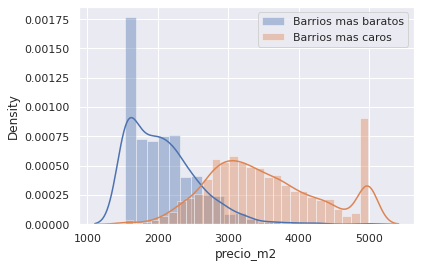

In [ ]:
g = sns.distplot(df[df.Barrio.isin(worst_10_b)]['precio_m2'], label="Barrios mas baratos")
sns.distplot(df[df.Barrio.isin(top_10_b)]['precio_m2'], label="Barrios mas caros")
plt.legend()

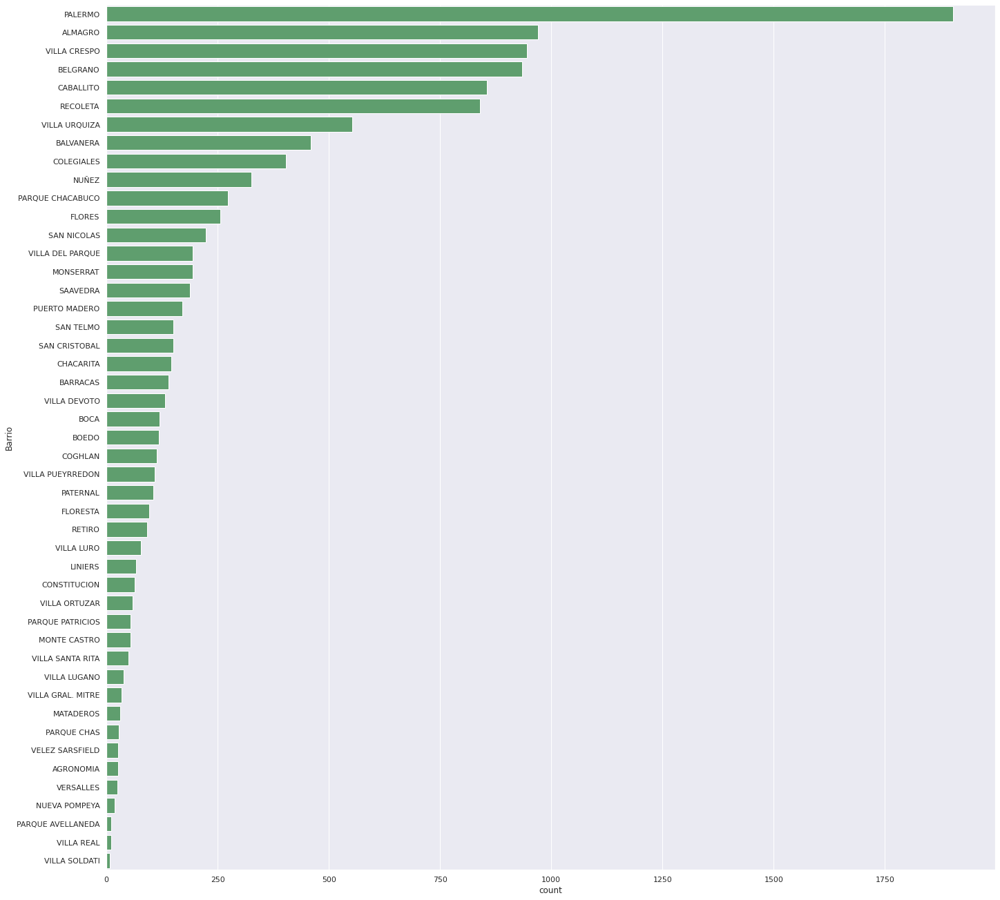

In [ ]:
fig= plt.subplots(figsize=(20,18),constrained_layout=True)
sns.countplot(data=df,y="Barrio",order=df["Barrio"].value_counts().index,color="g")


In [ ]:
df.groupby(['Barrio'], as_index=False).agg({'precio_m2':'mean'}).sort_values(by='precio_m2', ascending=False)[0:10]

,Barrio,precio_m2
26,PUERTO MADERO,4872.064671
20,PALERMO,3632.334780
4,BELGRANO,3631.846069
19,NUÑEZ,3547.895190
27,RECOLETA,3369.531764
9,COGHLAN,3288.178563
46,VILLA URQUIZA,3205.194390
29,SAAVEDRA,3197.005979
10,COLEGIALES,3088.989181
42,VILLA PUEYRREDON,3009.456312


In [ ]:
fig=px.bar(data_frame=df.groupby(['Barrio'], as_index=False).agg({'precio_m2':'mean'}).sort_values(by='precio_m2', ascending=True)[0:10],y='Barrio',x='precio_m2',
           text='precio_m2', color='Barrio')
fig.update_yaxes(type='category')
fig.update_traces(texttemplate='%{text:.2s}',textposition='outside',  marker_color='#7F9FF5', marker_line_color='#5660FC',
                  marker_line_width=1.5, opacity=0.6)

fig.update_layout(
    title="Los 10 Barrios mas baratos CABA",
    xaxis_title="Precio m2",
    yaxis_title="Barrio",
    legend_title="Barrio",
    font=dict(
        family="Calibri",
        size=20,
        color="black"
    )
)

fig.show()

#fig.for_each_xaxis(lambda axis: axis.title.update(font=dict(size=32)))
#fig.for_each_yaxis(lambda axis: axis.title.update(font=dict(size=32)))

In [ ]:
fig=px.bar(data_frame=df.groupby(['Barrio'], as_index=False).agg({'precio_m2':'mean'}).sort_values(by='precio_m2', ascending=False)[0:10],y='Barrio',x='precio_m2',
           text='precio_m2', color='Barrio')
fig.update_yaxes(type='category')
fig.update_traces(texttemplate='%{text:.2s}',textposition='outside',  marker_color='#D9B9AD', marker_line_color='#D98162',
                  marker_line_width=1.5, opacity=1)

fig.update_layout(
    title="Los 10 Barrios mas caros CABA",
    xaxis_title="Precio m2",
    yaxis_title="Barrio",
    legend_title="Barrio",
    font=dict(
        family="Calibri",
        size=20,
        color="black"
    )
)

fig.show()

#fig.for_each_xaxis(lambda axis: axis.title.update(font=dict(size=32)))
#fig.for_each_yaxis(lambda axis: axis.title.update(font=dict(size=32)))

In [ ]:
df_completo2

In [ ]:
fig=px.bar(data_frame=df_completo2.sort_values(by='Cantidad_publicaciones', ascending=True)[20:46],y='barrio',x='Cantidad_publicaciones',
           text='Cantidad_publicaciones', color='precio_prom_m2',  color_continuous_scale= 'RdBu_r', opacity=1 )
fig.update_yaxes(type='category')
fig.update_traces(texttemplate='%{text:.2s}',textposition='outside', marker_line_color='darkblue',
                  marker_line_width=0.1, opacity=1 )
fig.update_layout(
    title="Los barrios con mas publicaciones",
    xaxis_title="Cantidad Publicaciones",
    yaxis_title="Barrio",
    legend_title="Precio Promedio m2",
    font=dict(
        family="Calibri",
        size=20,
        color="black"
    )
)


fig.show()



In [ ]:
fig=px.bar(data_frame=df_completo2.sort_values(by='Cantidad_publicaciones', ascending=True)[32:47],y='barrio',x='Cantidad_publicaciones',
           text='Cantidad_publicaciones', color='precio_prom_m2', color_continuous_scale= 'RdBu_r', opacity=1 )
fig.update_yaxes(type='category')
fig.update_traces(texttemplate='%{text:.2s}',textposition='outside',  marker_line_color='darkblue',
                  marker_line_width=0.1, opacity=1)

fig.update_layout(
    title="Los 15 barrios con mas publicaciones",
    xaxis_title="Cantidad Publicaciones",
    yaxis_title="Barrio",
    font=dict(
        family="Calibri",
        size=20,
        color="black"
    )
)

fig.show()

In [ ]:
df.columns

Index(['lat', 'lon', 'Pais', 'Ciudad', 'Barrio', 'ambientes', 'bedrooms',
       'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency',
       'title', 'description', 'property_type', 'operation_type', 'precio_m2',
       'distancia_subte (km)', 'estacion_subte', 'geometry', 'year_s',
       'month_s'],
      dtype='object')

<Figure size 432x288 with 0 Axes>

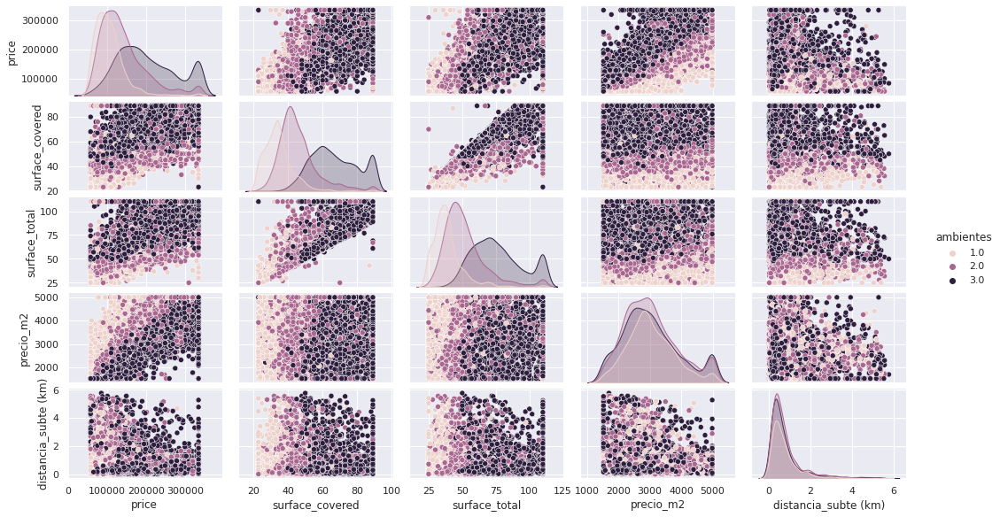

In [ ]:
figz= plt.figure()
mask_cols= ["ambientes","price","surface_covered","surface_total","precio_m2","distancia_subte (km)"]
graph=sns.pairplot(df[mask_cols],hue="ambientes")
graph.fig.set_size_inches(16,8)
plt.grid()
plt.show()

In [ ]:
df.to_csv('Base_properati_1q_limpia_F.csv')

## **Lectura BA Data**

Bases BA data:

In [ ]:
# # instalo geopandas
!pip install geopandas

In [3]:
#importamos las librerias
import numpy as np
import pandas as pd
import geopandas as gpd
import palettable
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
colectivos = gpd.read_file('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/colectivos/paradas-de-colectivo.geojson')

In [ ]:
metrobus= gpd.read_file('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/transporte/metrobus/estaciones-de-metrobus.geojson')

In [ ]:
bici=gpd.read_file('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/transporte/estaciones-bicicletas-publicas/nuevas-estaciones-bicicletas-publicas.geojson')

In [ ]:
subte= gpd.read_file('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/subte-estaciones/subte_estaciones.geojson')

In [ ]:
subte_l=gpd.read_file('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/subte-estaciones/subte_lineas.geojson')

In [4]:
tren= gpd.read_file('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/estaciones-de-ferrocarril/estaciones-de-ferrocarril.geojson')

In [ ]:
barrios = gpd.read_file('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/barrios/barrios.geojson')

In [ ]:
viajes_2019=pd.read_csv('https://cdn.buenosaires.gob.ar/datosabiertos/datasets/subte-viajes-molinetes/molinetes-2019.zip', compression='zip', header=0, sep=',', error_bad_lines=False)

In [5]:
tren

,long,lat,id,nombre,linea,linea_2,ramal,barrio,comuna,localidad,partido,geometry
0,-58.424982,-34.571748,1,3 de Febrero,Mitre,F.C.G.B.M.,Retiro - Mitre,Palermo,Comuna 14,None,None,POINT (-58.42498 -34.57175)
1,-58.461808,-34.568051,35,Belgrano R,Mitre,F.C.G.B.M.,Retiro - Mitre,Belgrano,Comuna 13,None,None,POINT (-58.46181 -34.56805)
2,-58.475349,-34.565261,90,Coghlan,Mitre,F.C.G.B.M.,Retiro - Mitre,Coghlan,Comuna 12,None,None,POINT (-58.47535 -34.56526)
3,-58.448253,-34.572975,91,Colegiales,Mitre,F.C.G.B.M.,Retiro - Mitre,Colegiales,Comuna 13,None,None,POINT (-58.44825 -34.57297)
4,-58.494130,-34.523089,119,Dr. Cetrángolo,Mitre,F.C.G.B.M.,Retiro - Mitre,None,None,Florida,Vicente L\u00f3pez,POINT (-58.49413 -34.52309)
...,...,...,...,...,...,...,...,...,...,...,...,...
225,-58.602045,-34.756480,256,María Eva Duarte,Belgrano Sur,F.C.G.B.,Buenos Aires - Gonzalez Catán,None,None,Gregorio de Laferrere,La Matanza,POINT (-58.60204 -34.75648)
226,-58.530728,-34.722369,321,Querandí,Belgrano Sur,F.C.G.B.,Buenos Aires - Gonzalez Catán,None,None,Ciudad Evita,La Matanza,POINT (-58.53073 -34.72237)
227,-58.188026,-34.833207,168,Gutiérrez,Roca,F.C.G.R.,Temperley - Gutiérrez,None,None,Juan Mar\u00eda Guti\u00e9rrez,Berazategui,POINT (-58.18803 -34.83321)
228,-58.213265,-34.825028,367,Santa Sofía,Roca,F.C.G.R.,Temperley - Gutiérrez,None,None,Bosques,Florencio Varela,POINT (-58.21327 -34.82503)


In [ ]:
viajes_2019.head()

,periodo,fecha,desde,hasta,linea,molinete,estacion,pax_pagos,pax_pases_pagos,pax_franq,total
0,201901,2019-01-01,08:00:00,08:15:00,LineaA,LineaA_Lima_N_Turn02,Lima,1.0,0.0,0.0,1.0
1,201901,2019-01-01,08:00:00,08:15:00,LineaA,LineaA_Loria_N_Turn03,Loria,3.0,0.0,0.0,3.0
2,201901,2019-01-01,08:00:00,08:15:00,LineaA,LineaA_Miserere_Q_HALL_Turn01,Plaza Miserere,3.0,0.0,0.0,3.0
3,201901,2019-01-01,08:00:00,08:15:00,LineaA,LineaA_Miserere_S_Turn01,Plaza Miserere,6.0,0.0,0.0,6.0
4,201901,2019-01-01,08:00:00,08:15:00,LineaA,LineaA_Miserere_S_Turn03,Plaza Miserere,10.0,0.0,0.0,10.0


In [ ]:
viajes_2019.groupby(['linea', 'estacion'], as_index=False)['total'].sum().rename({'total':'Cantidad de viajes'},axis=1)

,linea,estacion,Cantidad de viajes
0,LineaA,Acoyte,4456885.0
1,LineaA,Alberti,1514524.0
2,LineaA,Carabobo,3631250.0
3,LineaA,Castro Barros,2896026.0
4,LineaA,Congreso,4035424.0
...,...,...,...
89,LineaH,Las Heras,3922644.0
90,LineaH,Once,4743042.0
91,LineaH,Patricios,3527818.0
92,LineaH,Santa Fe,3600814.0


In [ ]:
df_viajes=viajes_2019.groupby(['linea'], as_index=False)['total'].sum().rename({'total':'Cantidad de viajes'},axis=1)

In [ ]:
df_viajes['Cantidad de viajes(M)']=df_viajes['Cantidad de viajes']/1000000

Text(0, 0.5, 'linea')

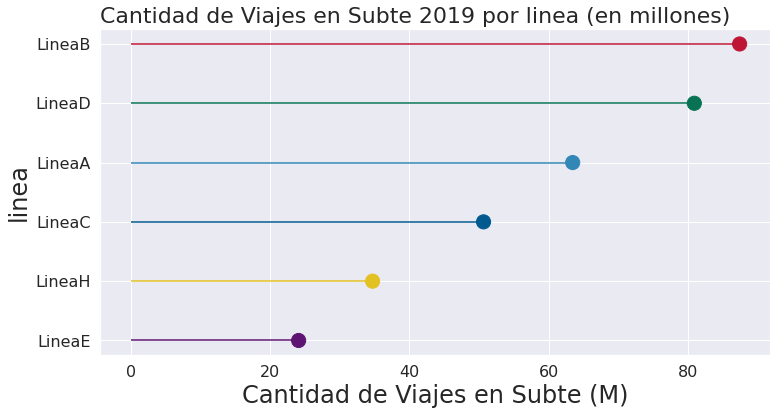

In [ ]:

fig, ax = plt.subplots(figsize=(12, 6))
ordered_df = df_viajes.sort_values(by='Cantidad de viajes(M)')
my_range=range(1,len(df_viajes.index)+1)
 
# Create a color if the group is "B"
my_color=np.where(ordered_df ['linea']=='LineaA', '#3287B6',
                  np.where(ordered_df ['linea']=='LineaB','#BF1534',
                           np.where(ordered_df ['linea']=='LineaC','#015A8F',
                                    np.where(ordered_df ['linea']=='LineaD','#077354',
                                             np.where(ordered_df ['linea']=='LineaE','#5E1473',
                                                      np.where(ordered_df ['linea']=='LineaH','#E4C123','black'))))))
my_size=np.where(ordered_df ['linea']=='LineaB', 200, 200)
# The vertival plot is made using the hline function

plt.hlines(y=my_range, xmin=0, xmax=ordered_df['Cantidad de viajes(M)'], color=my_color, alpha=1)

plt.scatter(ordered_df['Cantidad de viajes(M)'], my_range, color=my_color, s=my_size, alpha=1)

for label in (ax.get_xticklabels() + ax.get_yticklabels()):
	label.set_fontsize(16)

# Add title and exis names
plt.yticks(my_range, ordered_df['linea'])
plt.title("Cantidad de Viajes en Subte 2019 por linea (en millones)", loc='left', fontsize=22)
plt.xlabel('Cantidad de Viajes en Subte (M)', fontsize=24)
plt.ylabel('linea',fontsize=24)


In [ ]:
df_completo2[['barrio','precio_prom_m2']].sort_values(by='precio_prom_m2', ascending=False)[0:19]

,barrio,precio_prom_m2
39,PUERTO MADERO,4872.064671
33,PALERMO,3632.334780
42,BELGRANO,3631.846069
45,NUÑEZ,3547.895190
43,RECOLETA,3369.531764
21,COGHLAN,3288.178563
22,VILLA URQUIZA,3205.194390
20,SAAVEDRA,3197.005979
23,COLEGIALES,3088.989181
35,VILLA PUEYRREDON,3009.456312


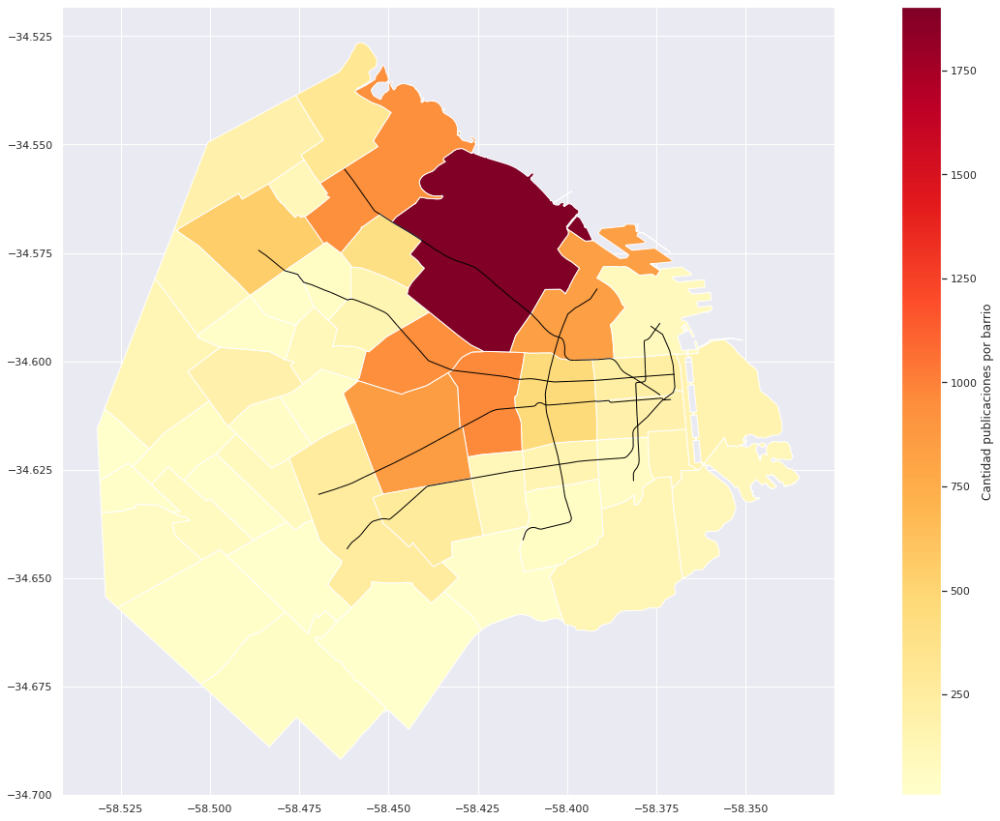

In [ ]:
base=df_completo2.plot(column='Cantidad_publicaciones',  cmap='YlOrRd',
            figsize=(25, 15), legend= True, 
            legend_kwds={'label': "Cantidad publicaciones por barrio",
                        'orientation': "vertical"})
subte_l.plot(ax=base,color='black', linewidth=1)


#legend 'reverse'

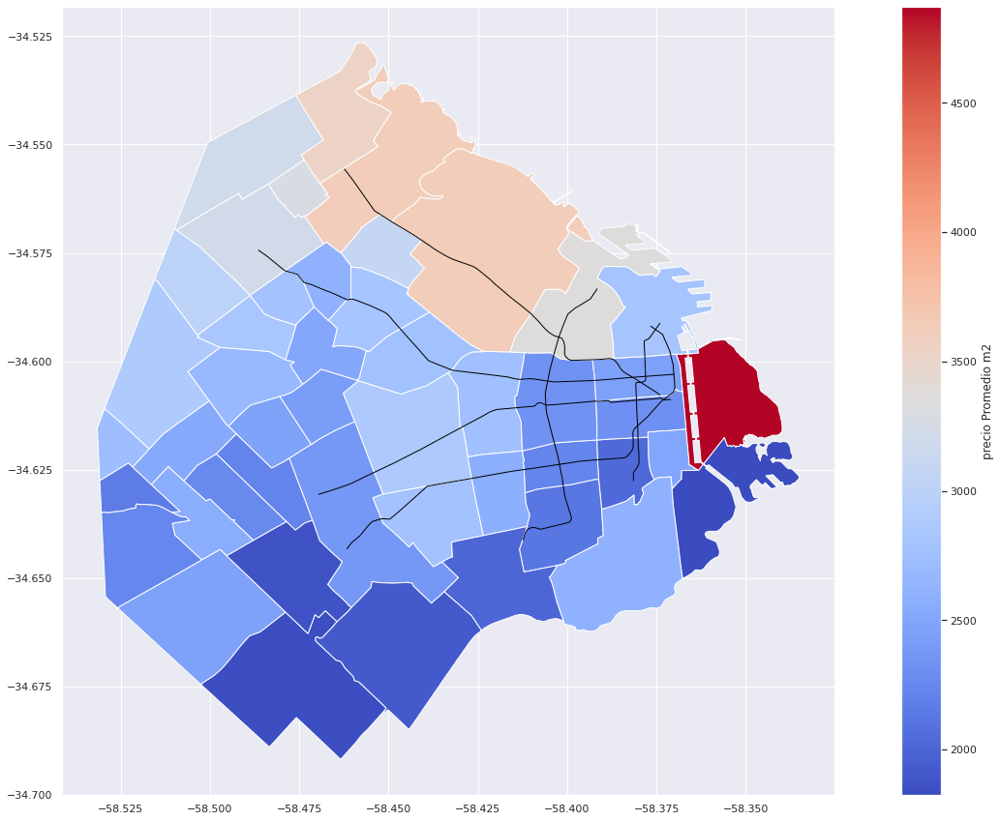

In [ ]:
#'PRGn_r'//'crest'

base=df_completo2.plot(column='precio_prom_m2',  legend=True,
            figsize=(25, 15), cmap='coolwarm',
            legend_kwds={'label': "precio Promedio m2",
                        'orientation': "vertical"})
subte_l.plot(ax=base,color='black', linewidth=1)

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:642: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



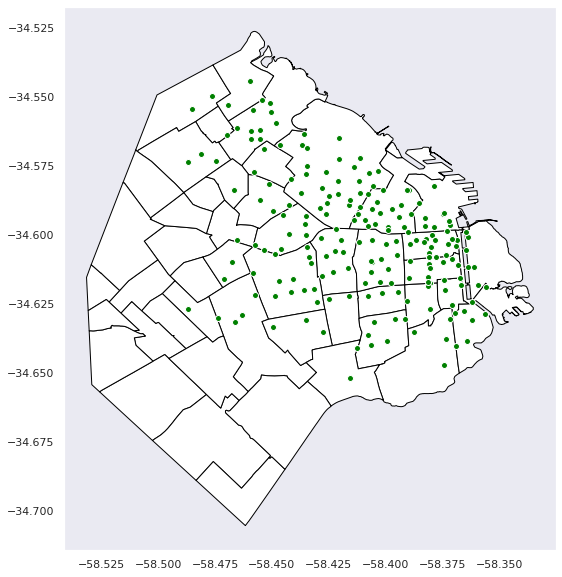

In [ ]:
base=barrios.plot(column='barrio',color='white', edgecolor='black', figsize=(20, 10) )
bici.plot( c='green', edgecolor = 'white', ax=base, figsize=(20, 10),legend=True,
          legend_kwds={'label': "Ecobicis",
                        'orientation': "vertical"})

# Add grid lines and show the plot

plt.grid()
plt.show()

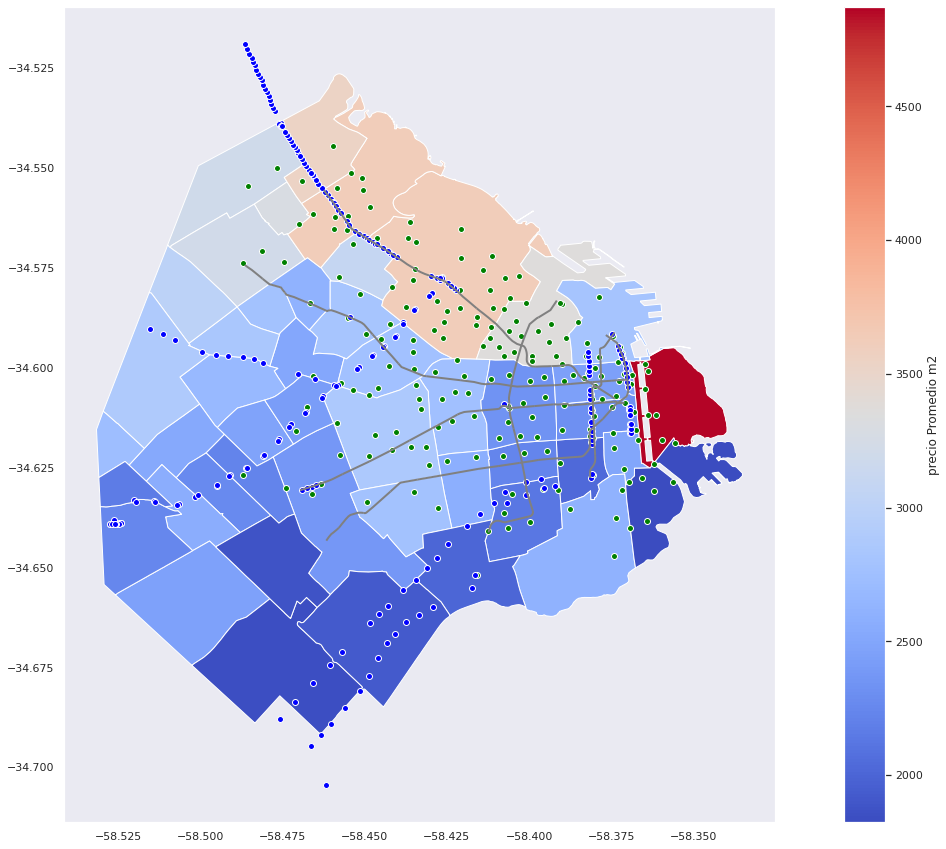

In [ ]:
base= df_completo2.plot(column='precio_prom_m2',  legend=True,
            figsize=(25, 15), cmap='coolwarm',
            legend_kwds={'label': "precio Promedio m2",
                        'orientation': "vertical"})
bici.plot( c='green', edgecolor = 'white', ax=base, figsize=(20, 10) )
metrobus.plot(c='blue', ax=base, edgecolor = 'white', figsize=(20, 15))
subte_l.plot(ax=base,color='gray', linewidth=2)

# Add grid lines and show the plot

plt.grid()
plt.show()

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:642: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:642: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



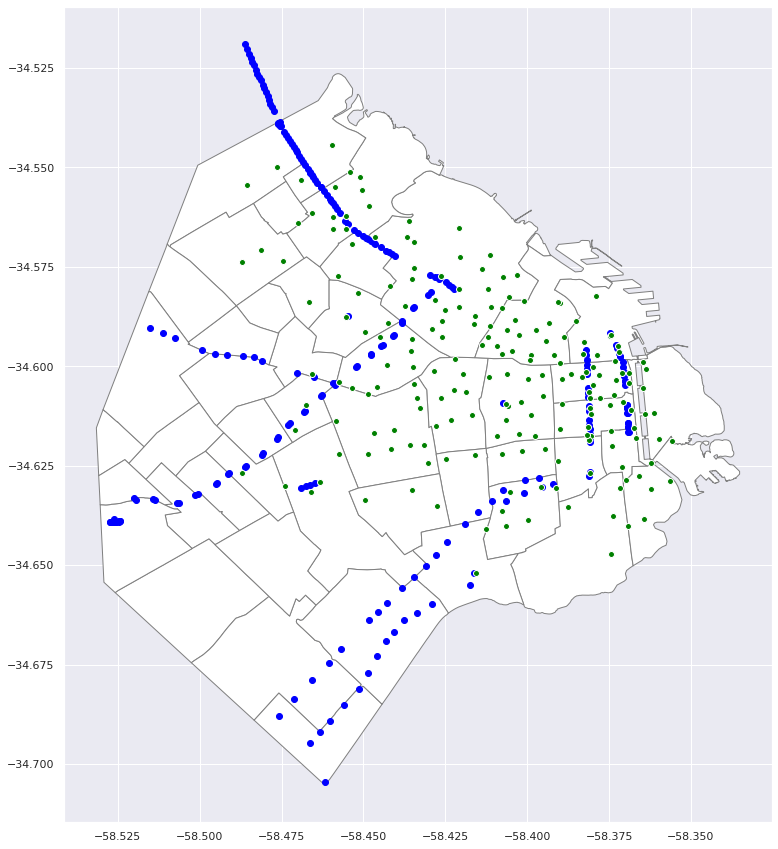

In [ ]:
base=barrios.plot(column='barrio', color='white', edgecolor='grey', figsize=(20, 15), legend=True)
metrobus.plot( column='METROBUS', ax=base, figsize=(20, 15), color='blue' )
bici.plot( c='green', edgecolor = 'white', ax=base, figsize=(20, 15),legend=True)
#subte_l.plot(ax=base,column='LINEASUB', linewidth=5,legend=True, cmap='Reds')
# Add grid lines and show the plot

plt.show()

extraemos la data de la estacion mas cercana

In [ ]:
df['linea_cercana']=df.estacion_subte.str.split(" - ",expand=True,)[0]

In [ ]:
df['linea_cercana_val']= df['linea_cercana']

In [ ]:
df["linea_cercana_val"].replace({"A": 1, "B": 2, "C":3, 'D':4, 'E':5, 'H':6}, inplace=True)

In [ ]:
df.head()

,lat,lon,Pais,Ciudad,Barrio,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,currency,title,description,property_type,operation_type,precio_m2,distancia_subte (km),estacion_subte,geometry,year_s,month_s,linea_cercana,linea_cercana_val
0,-34.554530,-58.467382,ARGENTINA,CAPITAL FEDERAL,NUÑEZ,3.0,NaN,2.0,95.0,84.0,335000.0,USD,VENTA DE DEPARTAMENTO DUPLEX EN NUÑEZ CON COCH...,¡DUPLEX DE 3 AMBIENTES CON COCHERA A ESTRENAR!...,DEPARTAMENTO,VENTA,4142.8600,0.419230,D - CONGRESO DE TUCUMAN,POINT (-58.4673817 -34.55453),2020,1,D,4
1,-34.603771,-58.381587,ARGENTINA,CAPITAL FEDERAL,NUÑEZ,3.0,2.0,2.0,110.0,73.0,298422.0,USD,VENTA - QUESADA 1540 1º B,SEMIPISO. EDIFICIO METRO 19. LIVING/COMEDOR. 2...,DEPARTAMENTO,VENTA,4087.9700,0.066992,B - C. PELLEGRINI,POINT (-58.381587 -34.603771),2020,1,B,2
2,-34.602753,-58.426922,ARGENTINA,CAPITAL FEDERAL,ALMAGRO,3.0,NaN,2.0,70.0,70.0,180000.0,USD,VENTA DEPARTAMENTO 3 AMBIENTES BALCÓN BAULERA ...,• EXCELENTE DEPARTAMENTO DE 3 AMBIENTES CON BA...,DEPARTAMENTO,VENTA,2571.4300,0.366217,B - ANGEL GALLARDO,POINT (-58.4269219 -34.6027525),2020,1,B,2
3,-34.640332,-58.529945,ARGENTINA,CAPITAL FEDERAL,LINIERS,2.0,1.0,1.0,32.0,33.0,57500.0,USD,VENTA DEPTO 2 AMB LUMINOSO EN LINIERS APTO PROF,CORREDOR RESPONSABLE: CARLOS ALARCON - CPI 505...,DEPARTAMENTO,VENTA,1526.7176,5.508995,A - SAN PEDRITO,POINT (-58.529945 -34.640332),2020,1,A,1
4,-34.559642,-58.461499,ARGENTINA,CAPITAL FEDERAL,BELGRANO,2.0,NaN,1.0,50.0,44.0,190000.0,USD,VENTA O ALQUILER - AMENABAR AL 3000 - 2 AMBIEN...,ALQUILER O VENTA - IMPECABLE DEPARTAMENTO DE 2...,DEPARTAMENTO,VENTA,4318.1800,0.359255,D - CONGRESO DE TUCUMAN,POINT (-58.461499418 -34.5596419392),2020,1,D,4


In [ ]:
df['subte_tipo']=df['linea_cercana']

In [ ]:
df.loc[df.linea_cercana.str.startswith('A') | df.linea_cercana.str.startswith('B')| df.linea_cercana.str.startswith('D') , ['subte_tipo']]='norte_sur'
df.loc[df.linea_cercana.str.startswith('C') | df.linea_cercana.str.startswith('H')| df.linea_cercana.str.startswith('E')  , ['subte_tipo']]='este_oeste'

In [ ]:
mask_cols= ["ambientes","price","surface_covered","surface_total","precio_m2","distancia_subte (km)", "linea_cercana"]
df.sort_values(by='linea_cercana')[mask_cols]

,ambientes,price,surface_covered,surface_total,precio_m2,distancia_subte (km),linea_cercana
3511,3.0,88000.0,51.0,51.0,1725.49,4.346995,A
10293,3.0,150000.0,80.0,88.0,1875.00,0.534914,A
3402,1.0,89000.0,37.0,42.0,2405.41,0.116401,A
3403,2.0,85000.0,39.0,39.0,2179.49,0.401533,A
3404,2.0,71500.0,34.0,34.0,2102.94,0.746875,A
...,...,...,...,...,...,...,...
5732,3.0,100000.0,60.0,67.0,1666.67,0.250472,H
5745,3.0,165000.0,79.0,88.0,2088.61,0.017037,H
3848,2.0,59900.0,30.0,30.0,1996.67,0.196010,H
9203,3.0,210000.0,78.0,82.0,2692.31,0.258286,H


In [ ]:
df.groupby(['linea_cercana'], as_index=False).agg({'precio_m2':['mean','std','count'],
                                                   'price':['mean','std','count']})


linea_cercana    precio_m2              ...          price                    
                        mean         std  ...           mean           std count
0             A  2724.831440  831.441479  ...  135047.072243  68909.226472  2104
1             B  2898.977000  650.390687  ...  139504.030019  57947.714910  4164
2             C  2420.693293  688.344547  ...  125341.098214  70417.896486   560
3             D  3569.688617  807.440955  ...  187329.621606  77215.587924  3462
4             E  2673.139536  800.420831  ...  141972.910367  76745.473050   926
5             H  3009.734935  916.361476  ...  158715.938010  81693.360676   613

[6 rows x 7 columns]

In [ ]:
df.loc[df.linea_cercana=='E',:].describe()

,lat,lon,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,precio_m2,distancia_subte (km),year_s,month_s,linea_cercana_val
count,926.000000,926.000000,926.000000,723.000000,911.000000,898.000000,926.000000,926.000000,926.000000,926.000000,926.0,926.000000,926.0
mean,-34.628693,-58.418098,2.052916,1.390041,1.124040,60.475501,52.321814,141972.910367,2673.139536,0.763718,2020.0,2.210583,5.0
std,0.017809,0.028405,0.779748,0.502085,0.355465,24.704044,18.416564,76745.473050,800.420831,0.939413,0.0,0.746839,0.0
min,-34.692403,-58.508137,1.000000,1.000000,1.000000,25.000000,23.000000,57500.000000,1526.717600,0.010767,2020.0,1.000000,5.0
25%,-34.642676,-58.438364,1.000000,1.000000,1.000000,42.000000,38.000000,85000.000000,2096.770000,0.256505,2020.0,2.000000,5.0
50%,-34.626975,-58.426525,2.000000,1.000000,1.000000,54.500000,49.000000,120000.000000,2661.725000,0.478604,2020.0,2.000000,5.0
75%,-34.621085,-58.391330,3.000000,2.000000,1.000000,72.000000,64.000000,170000.000000,3095.420000,1.147610,2020.0,3.000000,5.0
max,-34.587783,-58.363063,3.000000,3.000000,3.000000,110.000000,89.000000,335000.000000,4987.148000,5.535805,2020.0,3.000000,5.0


In [ ]:
df.groupby(['subte_tipo'], as_index=False).agg({'precio_m2':['mean','sum','count'],
                                                   'price':['mean','sum','count']})

subte_tipo    precio_m2                ...          price                    
                      mean           sum  ...           mean           sum count
0  este_oeste  2704.089076  5.675883e+06  ...  142425.345403  2.989508e+08  2099
1   norte_sur  3099.963779  3.016265e+07  ...  155556.934327  1.513569e+09  9730

[2 rows x 7 columns]

Pairplot diferenciando cercanos a lineas transversales a la ciudad

<Figure size 432x288 with 0 Axes>

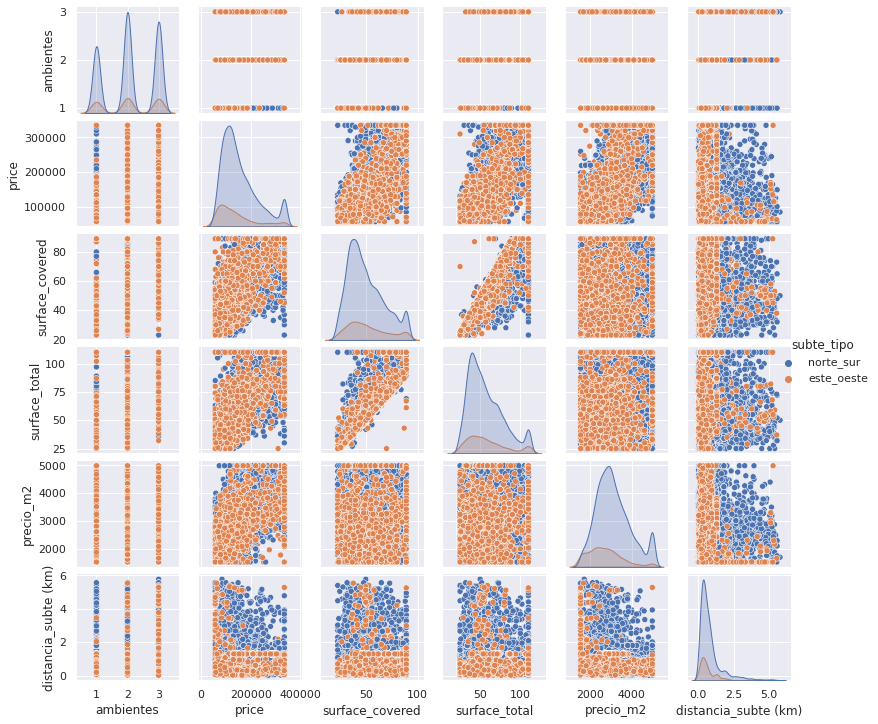

In [ ]:
figz= plt.figure()
mask_cols= ["ambientes","price","surface_covered","surface_total","precio_m2","distancia_subte (km)", "subte_tipo"]
graph=sns.pairplot(df.sort_values(by='linea_cercana')[mask_cols],hue="subte_tipo",
                   plot_kws=dict(alpha=1))
graph.fig.set_size_inches(12,10)
plt.grid()
plt.show()

In [ ]:
palette_={'A':'#3287B6', 
          'B':'#BF1534',
          'C':'#015A8F',
          'D':'#077354',
          'E':'#5E1473',
          'H':'#E4C123'}

<Figure size 432x288 with 0 Axes>

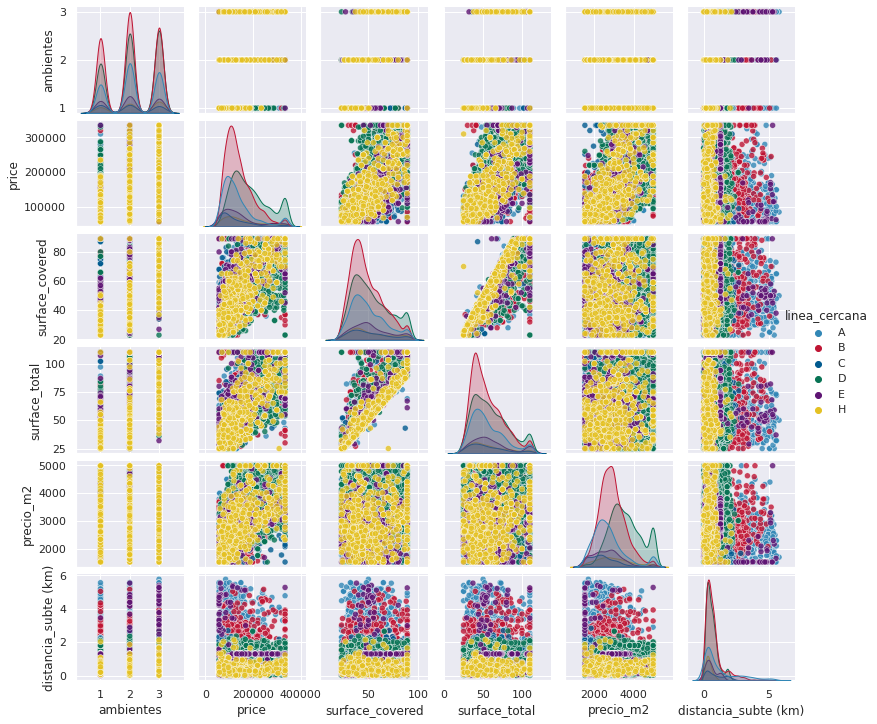

In [ ]:
figz= plt.figure()
mask_cols= ["ambientes","price","surface_covered","surface_total","precio_m2","distancia_subte (km)", "linea_cercana"]
graph=sns.pairplot(df.sort_values(by='linea_cercana')[mask_cols],hue="linea_cercana", palette=palette_, 
                   plot_kws=dict(alpha=0.8))
graph.fig.set_size_inches(12,10)
plt.grid()
plt.show()

In [ ]:
df['bin'] = pd.qcut(df['distancia_subte (km)'], 5)

In [ ]:
!pip install folium

In [ ]:
import folium

In [ ]:
gdf_bici = bici
gdf_bici['lon'] = gdf_bici.geometry.apply(lambda p: p.x)
gdf_bici['lat'] = gdf_bici.geometry.apply(lambda p: p.y)

In [ ]:
gdf_metrobus = metrobus
gdf_metrobus['lon'] = gdf_metrobus.geometry.apply(lambda p: p.x)
gdf_metrobus['lat'] = gdf_metrobus.geometry.apply(lambda p: p.y)

In [ ]:
gdf_colectivos = colectivos
gdf_colectivos['lon'] = gdf_colectivos.geometry.apply(lambda p: p.x)
gdf_colectivos['lat'] = gdf_colectivos.geometry.apply(lambda p: p.y)

In [ ]:
gdf_subte = subte
gdf_subte['lon'] = gdf_subte.geometry.apply(lambda p: p.x)
gdf_subte['lat'] = gdf_subte.geometry.apply(lambda p: p.y)

In [ ]:
gdf_tren =tren
gdf_tren['lon'] = gdf_tren.geometry.apply(lambda p: p.x)
gdf_tren['lat'] = gdf_tren.geometry.apply(lambda p: p.y)

In [ ]:
lat_avge=sum(gdf_subte['lat'])/len(gdf_subte['lat'])
lat_avge

-34.60650761996155

In [ ]:
long_avge=sum(gdf_subte['lon'])/len(gdf_subte['lon'])
long_avge

-58.41036159268022

In [ ]:
lat_avge

-34.60650761996155

In [ ]:
subte

,ID,ESTACION,LINEA,geometry,lon,lat
0,1.0,CASEROS,H,POINT (-58.39893 -34.63575),-58.398928,-34.635750
1,2.0,INCLAN - MEZQUITA AL AHMAD,H,POINT (-58.40097 -34.62938),-58.400970,-34.629376
2,3.0,HUMBERTO 1°,H,POINT (-58.40232 -34.62309),-58.402323,-34.623092
3,4.0,VENEZUELA,H,POINT (-58.40473 -34.61524),-58.404732,-34.615242
4,5.0,ONCE - 30 DE DICIEMBRE,H,POINT (-58.40604 -34.60894),-58.406036,-34.608935
...,...,...,...,...,...,...
85,86.0,SANTA FE - CARLOS JAUREGUI,H,POINT (-58.40238 -34.59453),-58.402376,-34.594525
86,87.0,FACULTAD DE DERECHO - JULIETA LANTERI,H,POINT (-58.39102 -34.58304),-58.391019,-34.583036
87,90.0,RETIRO,E,POINT (-58.37585 -34.59211),-58.375850,-34.592114
88,89.0,CATALINAS,E,POINT (-58.37170 -34.59660),-58.371700,-34.596597


In [ ]:
m=folium.Map(location=[lat_avge, long_avge],zoom_start=13)


#Barrios
style_function = lambda x: {
    'color': 'black',
    'weight': 0.7,
    'fillOpacity': 0.2
}

folium.GeoJson(
    barrios,
    style_function = style_function,
    name='Barrios',
    tooltip=folium.GeoJsonTooltip(
        fields=['barrio'],
        aliases=['barrio'],
        localize=True
    )
).add_to(m)


#Estaciones:
subway_group = folium.FeatureGroup(name="Estaciones_subte").add_to(m)
for i in range(0,gdf_subte.shape[0]):
  lat_=gdf_subte.loc[i,'lat']
  long_=gdf_subte.loc[i,'lon']
  linea=gdf_subte.loc[i,'LINEA']
  tipo_desc_=gdf_subte.loc[i, 'ESTACION']
  popup_='Linea:'+str(gdf_subte.loc[i,'LINEA']) + ',<br>Estacion:' + str(gdf_subte.loc[i,'ESTACION'])

  if linea=='A':
    subway_group.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#3287B6',color='white', icon='subway', prefix='fa')).add_to(m))
  elif linea =='B':
    subway_group.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#BF1534',color='white', icon='subway', prefix='fa')).add_to(m))
  elif linea =='C':
    subway_group.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#015A8F',color='white', icon='subway', prefix='fa')).add_to(m))
  elif linea =='D':
    subway_group.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#077354',color='white', icon='subway', prefix='fa')).add_to(m))
  elif linea == 'E':
    subway_group.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#5E1473', color='white', icon='subway', prefix='fa')).add_to(m))
  elif linea =='H':
    subway_group.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#E4C123', color='white', icon='subway', prefix='fa')).add_to(m))
  else:
    subway_group.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon='shift-fill',icon_color='black')).add_to(m))


style_function2 = lambda x: {
    'color': 'black',
    'weight': 0.5,
    'fillOpacity': 0.7
}


folium.GeoJson(
    subte_l,
    style_function = style_function2,
    name='lineasSubte',
    tooltip=folium.GeoJsonTooltip(
        fields=['LINEASUB'],
        aliases=['LINEASUB'],
        localize=True
    )
).add_to(m)


#########


# Add tiles
folium.TileLayer('OpenStreetMap').add_to(m)
folium.TileLayer('Stamen Terrain').add_to(m)
folium.TileLayer('Stamen Toner').add_to(m)
folium.TileLayer('Stamen Watercolor').add_to(m)
folium.TileLayer('CartoDB dark_matter').add_to(m)
folium.TileLayer('CartoDB positron').add_to(m)
folium.LayerControl(collapsed=False).add_to(m)

m

In [ ]:
subte_l.LINEASUB.unique()

array(['LINEA D', 'LINEA C', 'LINEA A', 'LINEA E', 'LINEA B', 'LINEA H'],
      dtype=object)

In [ ]:
m=folium.Map(location=[lat_avge, long_avge],zoom_start=12, tiles='CartoDB positron')


#Barrios Ciudad de buenos Aires
style_function = lambda x: {
    'color': 'black',
    'weight': 0.7,
    'fillOpacity': 0.2
}

folium.GeoJson(
    barrios,
    style_function = style_function,
    name='Barrios',
    tooltip=folium.GeoJsonTooltip(
        fields=['barrio'],
        aliases=['barrio'],
        localize=True
    )
).add_to(m)

#trazado linea de subtes
style_function2 = lambda x: {
    'color': 'black',
    'weight': 3,
    'fillOpacity': 1
}

folium.GeoJson(
    subte_l,
    style_function = style_function2,
    name='lineasSubte',
    tooltip=folium.GeoJsonTooltip(
        fields=['LINEASUB'],
        aliases=['LINEASUB'],
        localize=True
    )
).add_to(m)


#metrobus/Bici/Tren

feature_bici = folium.FeatureGroup(name='Ecobici')
feature_metro=folium.FeatureGroup(name='Metrobus')
feature_tren=folium.FeatureGroup(name='EstacionesTren')

for i in range(0,gdf_bici.shape[0]):
  folium.CircleMarker(location=[gdf_bici.loc[i,'lat'], gdf_bici.loc[i,'lon']], radius=1,
                            color='#5BDB1F',
                            fill_color='#408F1B',
                            fill=True
  ).add_to(feature_bici)


for i in range(0,gdf_metrobus.shape[0]):
  folium.CircleMarker(location=[gdf_metrobus.loc[i,'lat'], gdf_metrobus.loc[i,'lon']], radius=1,
                            color='#3540DB',
                            fill_color='#141C8F',
                            fill=True
  ).add_to(feature_metro)


for i in range(0,gdf_tren.shape[0]):
  folium.CircleMarker(location=[gdf_tren.loc[i,'lat'], gdf_tren.loc[i,'lon']], radius=1,
                            color='#13878F',
                            fill_color='#13878F',
                            fill=True
  ).add_to(feature_tren)


#Estaciones de Subte:
#subway_group = folium.FeatureGroup(name="Estaciones_subte").add_to(m)
feature_A = folium.FeatureGroup(name='Linea A').add_to(m)
feature_B = folium.FeatureGroup(name='Linea B').add_to(m)
feature_C = folium.FeatureGroup(name='Linea C').add_to(m)
feature_D = folium.FeatureGroup(name='Linea D').add_to(m)
feature_E = folium.FeatureGroup(name='Linea E').add_to(m)
feature_H = folium.FeatureGroup(name='Linea H').add_to(m)

for i in range(0,gdf_subte.shape[0]):
  lat_=gdf_subte.loc[i,'lat']
  long_=gdf_subte.loc[i,'lon']
  linea=gdf_subte.loc[i,'LINEA']
  tipo_desc_=gdf_subte.loc[i, 'ESTACION']
  popup_='Linea:'+str(gdf_subte.loc[i,'LINEA']) + ',<br>Estacion:' + str(gdf_subte.loc[i,'ESTACION'])

  if linea=='A':
    feature_A.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#3287B6',color='white', icon='subway', prefix='fa')).add_to(feature_A))
  elif linea =='B':
    feature_B.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#BF1534',color='white', icon='subway', prefix='fa')).add_to(feature_B))
  elif linea =='C':
    feature_C.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#015A8F',color='white', icon='subway', prefix='fa')).add_to(feature_C))
  elif linea =='D':
    feature_D.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#077354',color='white', icon='subway', prefix='fa')).add_to(feature_D))
  elif linea == 'E':
    feature_E.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#5E1473', color='white', icon='subway', prefix='fa')).add_to(feature_E))
  elif linea =='H':
    feature_H.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon_color='#E4C123', color='white', icon='subway', prefix='fa')).add_to(feature_H))
  else:
    feature_H.add_child(folium.Marker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon='shift-fill',icon_color='black')).add_to(m))





#########



feature_A.add_to(m)
feature_B.add_to(m)
feature_C.add_to(m)
feature_D.add_to(m)
feature_E.add_to(m)
feature_H.add_to(m)
feature_A.add_to(m)
feature_bici.add_to(m)
feature_metro.add_to(m)
feature_bici.add_to(m)
# Add tiles
#folium.TileLayer('OpenStreetMap').add_to(m)
#folium.TileLayer('Stamen Terrain').add_to(m)
#folium.TileLayer('Stamen Toner').add_to(m)
#folium.TileLayer('Stamen Watercolor').add_to(m)
#folium.TileLayer('CartoDB dark_matter').add_to(m)

folium.LayerControl(collapsed=False).add_to(m)

m

In [ ]:
from folium import plugins
from folium.plugins import HeatMap

In [ ]:
df2.head()

In [ ]:
df2=df

In [ ]:
m=folium.Map(location=[lat_avge, long_avge],zoom_start=12, tiles='CartoDB dark_matter')
#tiles='CartoDB dark_matter'

# Ensure you're handing it floats
df2['lat'] = df2['lat'].astype(float)
df2['lon'] = df2['lon'].astype(float)

# Filter the DF for rows, then columns, then remove NaNs
heat_df = df[['lat', 'lon']]
heat_df = heat_df.dropna(axis=0, subset=['lat','lon'])

# List comprehension to make out list of lists
heat_data = [[row['lat'],row['lon']] for index, row in heat_df.iterrows()]

# Plot it on the map

plugins.HeatMap(heat_data, radius = 14, min_opacity = 0.5, max_val =0.5, name='Propiedades_properati').add_to(m)




#Estaciones de Subte:
#subway_group = folium.FeatureGroup(name="Estaciones_subte").add_to(m)
feature_A = folium.FeatureGroup(name='Linea A').add_to(m)
feature_B = folium.FeatureGroup(name='Linea B').add_to(m)
feature_C = folium.FeatureGroup(name='Linea C').add_to(m)
feature_D = folium.FeatureGroup(name='Linea D').add_to(m)
feature_E = folium.FeatureGroup(name='Linea E').add_to(m)
feature_H = folium.FeatureGroup(name='Linea H').add_to(m)

for i in range(0,gdf_subte.shape[0]):
  lat_=gdf_subte.loc[i,'lat']
  long_=gdf_subte.loc[i,'lon']
  linea=gdf_subte.loc[i,'LINEA']
  tipo_desc_=gdf_subte.loc[i, 'ESTACION']
  popup_='Linea:'+str(gdf_subte.loc[i,'LINEA']) + ',<br>Estacion:' + str(gdf_subte.loc[i,'ESTACION'])

  if linea=='A':
    feature_A.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#3287B6', radius=3).add_to(feature_A))
  elif linea =='B':
    feature_B.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#BF1534', radius=3).add_to(feature_B))
  elif linea =='C':
    feature_C.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#015A8F',radius=3).add_to(feature_C))
  elif linea =='D':
    feature_D.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#077354',radius=3).add_to(feature_D))
  elif linea == 'E':
    feature_E.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#5E1473', radius=3).add_to(feature_E))
  elif linea =='H':
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#E4C123', radius=3).add_to(feature_H))
  else:
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon='shift-fill',icon_color='black')).add_to(m))



#########



feature_A.add_to(m)
feature_B.add_to(m)
feature_C.add_to(m)
feature_D.add_to(m)
feature_E.add_to(m)
feature_H.add_to(m)
feature_A.add_to(m)

style_function2 = lambda x: {
    'color': 'white',
    'weight': 3,
    'fillOpacity': 0
}


folium.GeoJson(
    subte_l,
    style_function = style_function2,
    name='lineasSubte',
    tooltip=folium.GeoJsonTooltip(
        fields=['LINEASUB'],
        aliases=['LINEASUB'],
        localize=True
    )
).add_to(m)

#Barrios
style_function = lambda x: {
    'color': '#CBC8D8',
    'weight': 0.5,
    'fillOpacity': 0.1
}

folium.GeoJson(
    barrios,
    style_function = style_function,
    name='Barrios',
    tooltip=folium.GeoJsonTooltip(
        fields=['barrio'],
        aliases=['barrio'],
        localize=True
    )
).add_to(m)


folium.LayerControl(collapsed=False).add_to(m)

# Display the map
m

In [ ]:
m= folium.Map(location=[lat_avge, long_avge],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='1 ambiente').add_to(m)
feature_2 = folium.FeatureGroup(name='2 ambientes').add_to(m)
feature_3 = folium.FeatureGroup(name='3 ambientes').add_to(m)

for i, v in df.iterrows():
    popup = """
    Ambientes : <b>%s</b><br>
    M2 : <b>%s</b><br>
    Precio : <b>%d</b><br>
    """ % (v['ambientes'], v['surface_covered'], v['price'])
    
    if v['ambientes'] == 1:
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=1,
                            tooltip=popup,
                            color='#FFBA00',
                            fill_color='#FFBA00',
                            fill=True).add_to(feature_1)
    elif v['ambientes'] == 2:
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=1,
                            tooltip=popup,
                            color='#FF0700',
                            fill_color='#FF0700',
                            fill=True).add_to(feature_2)
    elif v['ambientes'] == 3:
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=1,
                            tooltip=popup,
                            color='blue',
                            fill_color='blue',
                            fill=True).add_to(feature_3)


#Estaciones de Subte:
#subway_group = folium.FeatureGroup(name="Estaciones_subte").add_to(m)
feature_A = folium.FeatureGroup(name='Linea A').add_to(m)
feature_B = folium.FeatureGroup(name='Linea B').add_to(m)
feature_C = folium.FeatureGroup(name='Linea C').add_to(m)
feature_D = folium.FeatureGroup(name='Linea D').add_to(m)
feature_E = folium.FeatureGroup(name='Linea E').add_to(m)
feature_H = folium.FeatureGroup(name='Linea H').add_to(m)

for i in range(0,gdf_subte.shape[0]):
  lat_=gdf_subte.loc[i,'lat']
  long_=gdf_subte.loc[i,'lon']
  linea=gdf_subte.loc[i,'LINEA']
  tipo_desc_=gdf_subte.loc[i, 'ESTACION']
  popup_='Linea:'+str(gdf_subte.loc[i,'LINEA']) + ',<br>Estacion:' + str(gdf_subte.loc[i,'ESTACION'])

  if linea=='A':
    feature_A.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#3287B6', radius=3).add_to(feature_A))
  elif linea =='B':
    feature_B.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#BF1534', radius=3).add_to(feature_B))
  elif linea =='C':
    feature_C.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#015A8F',radius=3).add_to(feature_C))
  elif linea =='D':
    feature_D.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#077354',radius=3).add_to(feature_D))
  elif linea == 'E':
    feature_E.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#5E1473', radius=3).add_to(feature_E))
  elif linea =='H':
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#E4C123', radius=3).add_to(feature_H))
  else:
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon='shift-fill',icon_color='black')).add_to(m))



#########

style_function2 = lambda x: {
    'color': 'white',
    'weight': 3,
    'fillOpacity': 0
}


folium.GeoJson(
    subte_l,
    style_function = style_function2,
    name='lineasSubte',
    tooltip=folium.GeoJsonTooltip(
        fields=['LINEASUB'],
        aliases=['LINEASUB'],
        localize=True
    )
).add_to(m)

#Barrios
style_function = lambda x: {
    'color': '#CBC8D8',
    'weight': 0.5,
    'fillOpacity': 0.1
}

folium.GeoJson(
    barrios,
    style_function = style_function,
    name='Barrios',
    tooltip=folium.GeoJsonTooltip(
        fields=['barrio'],
        aliases=['barrio'],
        localize=True
    )
).add_to(m)




feature_A.add_to(m)
feature_B.add_to(m)
feature_C.add_to(m)
feature_D.add_to(m)
feature_E.add_to(m)
feature_H.add_to(m)
feature_A.add_to(m)
feature_1.add_to(m)
feature_2.add_to(m)
feature_3.add_to(m)
folium.LayerControl(collapsed=False).add_to(m)
m

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
m= folium.Map(location=[lat_avge, long_avge],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='Cercanos_Linea_A').add_to(m)
feature_2 = folium.FeatureGroup(name='Cercanos_Linea_B').add_to(m)
feature_3 = folium.FeatureGroup(name='Cercanos_Linea_C').add_to(m)
feature_4 = folium.FeatureGroup(name='Cercanos_Linea_D').add_to(m)
feature_5 = folium.FeatureGroup(name='Cercanos_Linea_E').add_to(m)
feature_6 = folium.FeatureGroup(name='Cercanos_Linea_H').add_to(m)


for i, v in df.iterrows():
    popup = """
    Ambientes : <b>%s</b><br>
    M2 : <b>%s</b><br>
    Precio : <b>%d</b><br>
    """ % (v['ambientes'], v['surface_covered'], v['price'])
    
    if v['linea_cercana'] == 'A':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#3287B6',
                            fill_color='#3287B6',
                            fill=True).add_to(feature_1)
 
    if v['linea_cercana'] == 'B':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#BF1534',
                            fill_color='#BF1534',
                            fill=True).add_to(feature_2)

    if v['linea_cercana'] == 'C':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#015A8F',
                            fill_color='#015A8F',
                            fill=True).add_to(feature_3)
      
    if v['linea_cercana'] == 'D':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#077354',
                            fill_color='#077354',
                            fill=True).add_to(feature_4)
                            
    if v['linea_cercana'] == 'E':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#5E1473',
                            fill_color='#5E1473',
                            fill=True).add_to(feature_5)
                            
    if v['linea_cercana'] == 'H':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#E4C123',
                            fill_color='#E4C123',
                            fill=True).add_to(feature_6)

                            
                            


#Estaciones de Subte:
#subway_group = folium.FeatureGroup(name="Estaciones_subte").add_to(m)
feature_A = folium.FeatureGroup(name='Linea A').add_to(m)
feature_B = folium.FeatureGroup(name='Linea B').add_to(m)
feature_C = folium.FeatureGroup(name='Linea C').add_to(m)
feature_D = folium.FeatureGroup(name='Linea D').add_to(m)
feature_E = folium.FeatureGroup(name='Linea E').add_to(m)
feature_H = folium.FeatureGroup(name='Linea H').add_to(m)

for i in range(0,gdf_subte.shape[0]):
  lat_=gdf_subte.loc[i,'lat']
  long_=gdf_subte.loc[i,'lon']
  linea=gdf_subte.loc[i,'LINEA']
  tipo_desc_=gdf_subte.loc[i, 'ESTACION']
  popup_='Linea:'+str(gdf_subte.loc[i,'LINEA']) + ',<br>Estacion:' + str(gdf_subte.loc[i,'ESTACION'])

  if linea=='A':
    feature_A.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#3287B6', radius=3).add_to(feature_A))
  elif linea =='B':
    feature_B.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#BF1534', radius=3).add_to(feature_B))
  elif linea =='C':
    feature_C.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#015A8F',radius=3).add_to(feature_C))
  elif linea =='D':
    feature_D.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#077354',radius=3).add_to(feature_D))
  elif linea == 'E':
    feature_E.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#5E1473', radius=3).add_to(feature_E))
  elif linea =='H':
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#E4C123', radius=3).add_to(feature_H))
  else:
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon='shift-fill',icon_color='black')).add_to(m))



#########

style_function2 = lambda x: {
    'color': 'white',
    'weight': 3,
    'fillOpacity': 0
}


folium.GeoJson(
    subte_l,
    style_function = style_function2,
    name='lineasSubte',
    tooltip=folium.GeoJsonTooltip(
        fields=['LINEASUB'],
        aliases=['LINEASUB'],
        localize=True
    )
).add_to(m)

#Barrios
style_function = lambda x: {
    'color': 'black',
    'weight': 0.5,
    'fillOpacity': 0.1
}

folium.GeoJson(
    barrios,
    style_function = style_function,
    name='Barrios',
    tooltip=folium.GeoJsonTooltip(
        fields=['barrio'],
        aliases=['barrio'],
        localize=True
    )
).add_to(m)




feature_A.add_to(m)
feature_B.add_to(m)
feature_C.add_to(m)
feature_D.add_to(m)
feature_E.add_to(m)
feature_H.add_to(m)
feature_A.add_to(m)
feature_1.add_to(m)
feature_2.add_to(m)
feature_3.add_to(m)
feature_4.add_to(m)
feature_5.add_to(m)
feature_6.add_to(m)
folium.LayerControl(collapsed=False).add_to(m)
m

Output hidden; open in https://colab.research.google.com to view.

Mapa agrupando Norte Sur/Este oeste

In [ ]:
m= folium.Map(location=[lat_avge, long_avge],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='Norte_Sur').add_to(m)
feature_2 = folium.FeatureGroup(name='Este_Oeste').add_to(m)


for i, v in df.iterrows():
    popup = """
    Ambientes : <b>%s</b><br>
    M2 : <b>%s</b><br>
    Precio : <b>%d</b><br>
    """ % (v['ambientes'], v['surface_covered'], v['price'])
    
    if v['subte_tipo'] == 'norte_sur':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#77ACD0',
                            fill_color='#77ACD0',
                            fill=True).add_to(feature_1)
 
    if v['subte_tipo'] == 'este_oeste':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#FF7F0E',
                            fill_color='#FF7F0E',
                            fill=True).add_to(feature_2)


                            


#Estaciones de Subte:
#subway_group = folium.FeatureGroup(name="Estaciones_subte").add_to(m)
feature_A = folium.FeatureGroup(name='Linea A').add_to(m)
feature_B = folium.FeatureGroup(name='Linea B').add_to(m)
feature_C = folium.FeatureGroup(name='Linea C').add_to(m)
feature_D = folium.FeatureGroup(name='Linea D').add_to(m)
feature_E = folium.FeatureGroup(name='Linea E').add_to(m)
feature_H = folium.FeatureGroup(name='Linea H').add_to(m)

for i in range(0,gdf_subte.shape[0]):
  lat_=gdf_subte.loc[i,'lat']
  long_=gdf_subte.loc[i,'lon']
  linea=gdf_subte.loc[i,'LINEA']
  tipo_desc_=gdf_subte.loc[i, 'ESTACION']
  popup_='Linea:'+str(gdf_subte.loc[i,'LINEA']) + ',<br>Estacion:' + str(gdf_subte.loc[i,'ESTACION'])

  if linea=='A':
    feature_A.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#3287B6', radius=3).add_to(feature_A))
  elif linea =='B':
    feature_B.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#BF1534', radius=3).add_to(feature_B))
  elif linea =='C':
    feature_C.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#015A8F',radius=3).add_to(feature_C))
  elif linea =='D':
    feature_D.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#077354',radius=3).add_to(feature_D))
  elif linea == 'E':
    feature_E.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#5E1473', radius=3).add_to(feature_E))
  elif linea =='H':
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#E4C123', radius=3).add_to(feature_H))
  else:
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon='shift-fill',icon_color='black')).add_to(m))



#########

style_function2 = lambda x: {
    'color': 'white',
    'weight': 3,
    'fillOpacity': 0
}


folium.GeoJson(
    subte_l,
    style_function = style_function2,
    name='lineasSubte',
    tooltip=folium.GeoJsonTooltip(
        fields=['LINEASUB'],
        aliases=['LINEASUB'],
        localize=True
    )
).add_to(m)

#Barrios
style_function = lambda x: {
    'color': 'black',
    'weight': 0.5,
    'fillOpacity': 0.1
}

folium.GeoJson(
    barrios,
    style_function = style_function,
    name='Barrios',
    tooltip=folium.GeoJsonTooltip(
        fields=['barrio'],
        aliases=['barrio'],
        localize=True
    )
).add_to(m)




feature_A.add_to(m)
feature_B.add_to(m)
feature_C.add_to(m)
feature_D.add_to(m)
feature_E.add_to(m)
feature_H.add_to(m)
feature_A.add_to(m)
feature_1.add_to(m)
feature_2.add_to(m)

folium.LayerControl(collapsed=False).add_to(m)
m

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
df.subte_tipo.unique()	

array(['norte_sur', 'este_oeste'], dtype=object)

In [ ]:
m= folium.Map(location=[lat_avge, long_avge],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='Cercanos_Linea_A').add_to(m)
feature_2 = folium.FeatureGroup(name='Cercanos_Linea_B').add_to(m)
feature_3 = folium.FeatureGroup(name='Cercanos_Linea_C').add_to(m)
feature_4 = folium.FeatureGroup(name='Cercanos_Linea_D').add_to(m)
feature_5 = folium.FeatureGroup(name='Cercanos_Linea_E').add_to(m)
feature_6 = folium.FeatureGroup(name='Cercanos_Linea_H').add_to(m)


for i, v in df.iterrows():
    popup = """
    Ambientes : <b>%s</b><br>
    M2 : <b>%s</b><br>
    Precio : <b>%d</b><br>
    """ % (v['ambientes'], v['surface_covered'], v['price'])
    
    if v['linea_cercana'] == 'A':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#3287B6',
                            fill_color='#3287B6',
                            fill=True).add_to(feature_1)
 
    if v['linea_cercana'] == 'B':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#BF1534',
                            fill_color='#BF1534',
                            fill=True).add_to(feature_2)

    if v['linea_cercana'] == 'C':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#015A8F',
                            fill_color='#015A8F',
                            fill=True).add_to(feature_3)
      
    if v['linea_cercana'] == 'D':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#077354',
                            fill_color='#077354',
                            fill=True).add_to(feature_4)
                            
    if v['linea_cercana'] == 'E':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#5E1473',
                            fill_color='#5E1473',
                            fill=True).add_to(feature_5)
                            
    if v['linea_cercana'] == 'H':
        folium.CircleMarker(location=[v['lat'], v['lon']],
                            radius=2,
                            tooltip=popup,
                            color='#E4C123',
                            fill_color='#E4C123',
                            fill=True).add_to(feature_6)
                          
#Estaciones de Subte:
#subway_group = folium.FeatureGroup(name="Estaciones_subte").add_to(m)
feature_A = folium.FeatureGroup(name='Linea A').add_to(m)
feature_B = folium.FeatureGroup(name='Linea B').add_to(m)
feature_C = folium.FeatureGroup(name='Linea C').add_to(m)
feature_D = folium.FeatureGroup(name='Linea D').add_to(m)
feature_E = folium.FeatureGroup(name='Linea E').add_to(m)
feature_H = folium.FeatureGroup(name='Linea H').add_to(m)

for i in range(0,gdf_subte.shape[0]):
  lat_=gdf_subte.loc[i,'lat']
  long_=gdf_subte.loc[i,'lon']
  linea=gdf_subte.loc[i,'LINEA']
  tipo_desc_=gdf_subte.loc[i, 'ESTACION']
  popup_='Linea:'+str(gdf_subte.loc[i,'LINEA']) + ',<br>Estacion:' + str(gdf_subte.loc[i,'ESTACION'])

  if linea=='A':
    feature_A.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#3287B6', radius=3).add_to(feature_A))
  elif linea =='B':
    feature_B.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#BF1534', radius=3).add_to(feature_B))
  elif linea =='C':
    feature_C.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#015A8F',radius=3).add_to(feature_C))
  elif linea =='D':
    feature_D.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#077354',radius=3).add_to(feature_D))
  elif linea == 'E':
    feature_E.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#5E1473', radius=3).add_to(feature_E))
  elif linea =='H':
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,color='#E4C123', radius=3).add_to(feature_H))
  else:
    feature_H.add_child(folium.CircleMarker(location=[lat_,long_],popup=popup_,icon=folium.Icon(icon='shift-fill',icon_color='black')).add_to(m))



#########

style_function2 = lambda x: {
    'color': 'white',
    'weight': 3,
    'fillOpacity': 0
}


folium.GeoJson(
    subte_l,
    style_function = style_function2,
    name='lineasSubte',
    tooltip=folium.GeoJsonTooltip(
        fields=['LINEASUB'],
        aliases=['LINEASUB'],
        localize=True
    )
).add_to(m)

#Barrios
#style_function = lambda x: {
#    'color': 'black',
#    'weight': 0.5,
#    'fillOpacity': 0.1
#}
#
#folium.GeoJson(
#    barrios,
#    style_function = style_function,
#    name='Barrios',
#    tooltip=folium.GeoJsonTooltip(
#        fields=['barrio'],
#        aliases=['barrio'],
#        localize=True
#    )
#).add_to(m)

choropleth = folium.Choropleth(
    geo_data=barrios,
    name='precio_prom_m2',
    data=df_completo2,
    columns=['barrio', 'precio_prom_m2'],
    key_on='feature.properties.barrio',
    fill_color='RdBu_r', 
    fill_opacity=0.60, 
    line_opacity=0.75,
    legend_name='Precio Promedio m2',
    smooth_factor=0).add_to(m)



choropleth2 = folium.Choropleth(
    geo_data=barrios,
    name='cant_publicaciones',
    data=df_completo2,
    columns=['barrio', 'Cantidad_publicaciones'],
    key_on='feature.properties.barrio',
    fill_color='YlOrRd', 
    fill_opacity=0.60, 
    line_opacity=0.75,
    legend_name='Cantidad Publicaciones',
    smooth_factor=0).add_to(m)


# add labels indicating the name of the community
style_function = "font-size: 15px; font-weight: bold"
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['barrio'], style=style_function, labels=False))




feature_A.add_to(m)
feature_B.add_to(m)
feature_C.add_to(m)
feature_D.add_to(m)
feature_E.add_to(m)
feature_H.add_to(m)
feature_A.add_to(m)
feature_1.add_to(m)
feature_2.add_to(m)
feature_3.add_to(m)
feature_4.add_to(m)
feature_5.add_to(m)
feature_6.add_to(m)
folium.LayerControl(collapsed=False).add_to(m)
m
display(m)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
df_completo2.head()

,barrio,comuna,perimetro,area,geometry,precio_prom_m2,Cantidad_publicaciones,precio_prom_propiedad
0,CHACARITA,15,7724.852955,3.115707e+06,"POLYGON ((-58.45282 -34.59599, -58.45366 -34.5...",2821.068880,145,129437.620690
1,PATERNAL,15,7087.513295,2.229829e+06,"POLYGON ((-58.46558 -34.59656, -58.46562 -34.5...",2509.796000,105,110251.790476
2,VILLA CRESPO,15,8131.857075,3.615978e+06,"POLYGON ((-58.42375 -34.59783, -58.42495 -34.5...",2767.573635,945,131527.806349
3,VILLA DEL PARQUE,11,7705.389797,3.399596e+06,"POLYGON ((-58.49461 -34.61487, -58.49479 -34.6...",2688.497347,193,131611.829016
4,ALMAGRO,5,8537.901368,4.050752e+06,"POLYGON ((-58.41287 -34.61412, -58.41282 -34.6...",2752.740141,970,132604.244330


## **Nube de Palabras**

In [ ]:
# Dataframes
import pandas as pd
import numpy as np
from datetime import datetime
import json
import requests
#from google.colab import drive 

# Procesamiento de texto
import re
import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.util import ngrams

# Visualización
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
#import squarify
from wordcloud import WordCloud
from bs4 import BeautifulSoup

In [ ]:
#tabla= pd.read_csv("results-20201222-212018.csv")
#tabla.head()

In [ ]:
#tabla_caba=tabla.loc[tabla.l2=='Capital Federal',:]
#tabla_caba.head()

In [ ]:
tabla_caba_venta=tabla_caba.loc[tabla.operation_type==('Venta'),("description")]
tabla_caba_venta.tail()

In [ ]:
tabla_caba_alquiler=tabla_caba.loc[tabla.operation_type==('Alquiler'),("description")]
tabla_caba_alquiler.head()

31    Mucha LuzPiso en Torre, 2 dormitorios, 2 baños...
32    Corredor Responsable: Jorge Roca - CMCPSM 2550...
35    QUERES VIVIR EN ALGO NUEVO Y DIFERENTE EN DEVO...
36    Cómodo depto 3 Amb Balcón luminoso Lavadero Sa...
44    inmejorable ubicaicion 2 ambientes amplio al c...
Name: description, dtype: object

In [ ]:
comen_alq=tabla_caba_alquiler.values.tolist() 

In [ ]:
comen_v=tabla_caba_venta.values.tolist() 

In [ ]:
comen_alquiler="".join(comen_alq)
comen_alquiler

'Mucha LuzPiso en Torre, 2 dormitorios, 2 baños ( uno con ducha y otro con bañadera), lavaderoCochera FijaSeguridad 24 hs.Expensas: $15000Corredor Responsable: Jorge Roca - CMCPSM 2550 / CUCICBA 6878Contacto: Nicolás Medina Kelly - MLS ID # 420721035-302MARTILLERO:<br>Jorge Roca - CMCPSM Mat Nº2550 - CUCICBA Mat Nº6878<br><br>Todas las propiedades que figuran en mi perfil se encuentran a cargo del profesional matriculado de la oficina, la intermediación y la conclusión de las operaciones serán llevadas exclusivamente por él.<br><br><br><br><br>ALQUILER DEPARTAMENTO DE 3 AMBIENTES EN SAAVEDRA. VILELA ENTRE PINTO Y ZAPIOLA.<br><br>Se trata de un hermoso departamento con dos dormitorios, desarrollado sobre un hermoso edificio de excelente calidad constructiva. Ubicado en el segundo piso, al contrafrente, lo cual aprovecha la luz solar durante todo el día, recibiendo iluminación natural en la cocina con espacio para comedor (separado el lavadero) y también en el amplio living con balcón. L

In [ ]:
comen_venta = "".join(comen_v)
comen_venta

'Corredor Responsable: Ariel Champanier - CUCICBA 4330Contacto: Agustin Vidal - MLS ID # 420511114-19MARTILLEROS<br>ARIEL CHAMPANIER CUCICBA 4330 / RAMIRO CAPPELLONI CSI 5634<br><br>?<br><br>Todas las propiedades que figuran en mi perfil se encuentran a cargo del profesional matriculado de la oficina, la intermediación y la conclusión de las operaciones serán llevadas exclusivamente por él.<br><br><br>PH de 3 Ambientes en Palermo Hollywood<br>Inmejorable zona turística y espacio Audiovisual, tanto para inversor como para residencial<br><br><br>El departamento se encuentra en perfecto estado. Ubicado en la segunda planta, al frente con Balcón corrido, que se accede tanto por el Living como por el dormitorio principal, que también orienta al frente.<br>Ingreso, accedemos hacia la izquierda a la cocina, separada del Living, con el lavadero que ventila al patio interno.<br>Hall de distribución con placard empotrado para espacio de guarda, que conjuntamente acceso a los dormitorios y al Bañ

In [ ]:
reseña_venta=comen_venta.replace("\n","").replace("-","").replace(":","").replace(".","").replace(",","").replace("Ho","").replace("(","").replace(")","").replace("/","").replace("<","").replace(">","").replace("br","").replace("CUCICBA","").replace("DE","").replace("MLS","").replace("ID","").replace("Y","").replace("ar","")
reseña_venta=reseña_venta.lower()
reseña_venta

'corredor responsable ariel champanier   4330contacto agustin vidal    # 42051111419martillerosariel champanier  4330  ramiro cappelloni csi 5634?todas las propiedades que figuran en mi perfil se encuentran a cgo del profesional matriculado de la oficina la intermediación y la conclusión de las operaciones serán llevadas exclusivamente por élph de 3 ambientes en palermo llywoodinmejorable zona turística y espacio audiovisual tanto pa inversor como pa residencialel deptamento se encuentra en perfecto estado ubicado en la segunda planta al frente con balcón corrido que se accede tanto por el living como por el dormitorio principal que también orienta al frenteingreso accedemos hacia la izquierda a la cocina sepada del living con el lavadero que ventila al patio internohall de distribución con placd empotrado pa espacio de guda que conjuntamente acceso a los dormitorios y al baño completo que también ventila al frente el segundo dormitorio ventila al contrafrente todos los ambientes lumin

In [ ]:
reseña_alq=comen_alquiler.replace("\n","").replace("-","").replace(":","").replace(".","").replace(",","").replace("Ho","").replace("(","").replace(")","").replace("/","").replace("<","").replace(">","").replace("br","").replace("CUCICBA","").replace("DE","").replace("MLS","").replace("ID","").replace("Y","").replace("ar","").replace("CON","").replace("EN","").replace("La","").replace("El","")
reseña_alq=reseña_alq.lower()
reseña_alq

'mucha luzpiso en torre 2 dormitorios 2 baños  uno con ducha y otro con bañadera lavaderocochera fijaseguridad 24 hsexpensas $15000corredor responsable jorge roca  cmcpsm 2550   6878contacto nicolás medina kelly    # 420721035302martillerojorge roca  cmcpsm mat nº2550   mat nº6878todas las propiedades que figuran en mi perfil se encuentran a cgo del profesional matriculado de la oficina la intermediación y la conclusión de las operaciones serán llevadas exclusivamente por élalquiler partamto  3 ambites  saavedra vilela tre pinto  zapiolase trata de un hermoso deptamento con dos dormitorios desrollado soe un hermoso edificio de excelente calidad constructiva ubicado en el segundo piso al contrafrente lo cual aprovecha la luz sol durante todo el día recibiendo iluminación natural en la cocina con espacio pa comedor sepado el lavadero y también en el amplio living con balcón los dos dormitorios presentan placd con vista abierta como se puede apreci en las fotos baño completo encgada vivie

In [ ]:
nltk.download("stopwords")
nltk.download("punkt")
sw=stopwords.words("spanish")

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\rodri\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\rodri\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
unigram_v=nltk.word_tokenize(reseña_venta)
unigram_v

['corredor',
 'responsable',
 'ariel',
 'champanier',
 '4330contacto',
 'agustin',
 'vidal',
 '#',
 '42051111419martillerosariel',
 'champanier',
 '4330',
 'ramiro',
 'cappelloni',
 'csi',
 '5634',
 '?',
 'todas',
 'las',
 'propiedades',
 'que',
 'figuran',
 'en',
 'mi',
 'perfil',
 'se',
 'encuentran',
 'a',
 'cgo',
 'del',
 'profesional',
 'matriculado',
 'de',
 'la',
 'oficina',
 'la',
 'intermediación',
 'y',
 'la',
 'conclusión',
 'de',
 'las',
 'operaciones',
 'serán',
 'llevadas',
 'exclusivamente',
 'por',
 'élph',
 'de',
 '3',
 'ambientes',
 'en',
 'palermo',
 'llywoodinmejorable',
 'zona',
 'turística',
 'y',
 'espacio',
 'audiovisual',
 'tanto',
 'pa',
 'inversor',
 'como',
 'pa',
 'residencialel',
 'deptamento',
 'se',
 'encuentra',
 'en',
 'perfecto',
 'estado',
 'ubicado',
 'en',
 'la',
 'segunda',
 'planta',
 'al',
 'frente',
 'con',
 'balcón',
 'corrido',
 'que',
 'se',
 'accede',
 'tanto',
 'por',
 'el',
 'living',
 'como',
 'por',
 'el',
 'dormitorio',
 'principal',
 

In [ ]:
unigram_alq=nltk.word_tokenize(reseña_alq)
unigram_alq

['mucha',
 'luzpiso',
 'en',
 'torre',
 '2',
 'dormitorios',
 '2',
 'baños',
 'uno',
 'con',
 'ducha',
 'y',
 'otro',
 'con',
 'bañadera',
 'lavaderocochera',
 'fijaseguridad',
 '24',
 'hsexpensas',
 '$',
 '15000corredor',
 'responsable',
 'jorge',
 'roca',
 'cmcpsm',
 '2550',
 '6878contacto',
 'nicolás',
 'medina',
 'kelly',
 '#',
 '420721035302martillerojorge',
 'roca',
 'cmcpsm',
 'mat',
 'nº2550',
 'mat',
 'nº6878todas',
 'las',
 'propiedades',
 'que',
 'figuran',
 'en',
 'mi',
 'perfil',
 'se',
 'encuentran',
 'a',
 'cgo',
 'del',
 'profesional',
 'matriculado',
 'de',
 'la',
 'oficina',
 'la',
 'intermediación',
 'y',
 'la',
 'conclusión',
 'de',
 'las',
 'operaciones',
 'serán',
 'llevadas',
 'exclusivamente',
 'por',
 'élalquiler',
 'partamto',
 '3',
 'ambites',
 'saavedra',
 'vilela',
 'tre',
 'pinto',
 'zapiolase',
 'trata',
 'de',
 'un',
 'hermoso',
 'deptamento',
 'con',
 'dos',
 'dormitorios',
 'desrollado',
 'soe',
 'un',
 'hermoso',
 'edificio',
 'de',
 'excelente',
 'ca

In [ ]:
unigram_venta=[i for i in unigram_v if i not in sw]
unigram_venta

['corredor',
 'responsable',
 'ariel',
 'champanier',
 '4330contacto',
 'agustin',
 'vidal',
 '#',
 '42051111419martillerosariel',
 'champanier',
 '4330',
 'ramiro',
 'cappelloni',
 'csi',
 '5634',
 '?',
 'todas',
 'propiedades',
 'figuran',
 'perfil',
 'encuentran',
 'cgo',
 'profesional',
 'matriculado',
 'oficina',
 'intermediación',
 'conclusión',
 'operaciones',
 'llevadas',
 'exclusivamente',
 'élph',
 '3',
 'ambientes',
 'palermo',
 'llywoodinmejorable',
 'zona',
 'turística',
 'espacio',
 'audiovisual',
 'pa',
 'inversor',
 'pa',
 'residencialel',
 'deptamento',
 'encuentra',
 'perfecto',
 'ubicado',
 'segunda',
 'planta',
 'frente',
 'balcón',
 'corrido',
 'accede',
 'living',
 'dormitorio',
 'principal',
 'orienta',
 'frenteingreso',
 'accedemos',
 'hacia',
 'izquierda',
 'cocina',
 'sepada',
 'living',
 'lavadero',
 'ventila',
 'patio',
 'internohall',
 'distribución',
 'placd',
 'empotrado',
 'pa',
 'espacio',
 'guda',
 'conjuntamente',
 'acceso',
 'dormitorios',
 'baño',
 

In [ ]:
unigram_alquiler=[i for i in unigram_alq if i not in sw]
unigram_alquiler

['mucha',
 'luzpiso',
 'torre',
 '2',
 'dormitorios',
 '2',
 'baños',
 'ducha',
 'bañadera',
 'lavaderocochera',
 'fijaseguridad',
 '24',
 'hsexpensas',
 '$',
 '15000corredor',
 'responsable',
 'jorge',
 'roca',
 'cmcpsm',
 '2550',
 '6878contacto',
 'nicolás',
 'medina',
 'kelly',
 '#',
 '420721035302martillerojorge',
 'roca',
 'cmcpsm',
 'mat',
 'nº2550',
 'mat',
 'nº6878todas',
 'propiedades',
 'figuran',
 'perfil',
 'encuentran',
 'cgo',
 'profesional',
 'matriculado',
 'oficina',
 'intermediación',
 'conclusión',
 'operaciones',
 'llevadas',
 'exclusivamente',
 'élalquiler',
 'partamto',
 '3',
 'ambites',
 'saavedra',
 'vilela',
 'tre',
 'pinto',
 'zapiolase',
 'trata',
 'hermoso',
 'deptamento',
 'dos',
 'dormitorios',
 'desrollado',
 'soe',
 'hermoso',
 'edificio',
 'excelente',
 'calidad',
 'constructiva',
 'ubicado',
 'segundo',
 'piso',
 'contrafrente',
 'aprovecha',
 'luz',
 'sol',
 'día',
 'recibiendo',
 'iluminación',
 'natural',
 'cocina',
 'espacio',
 'pa',
 'comedor',
 '

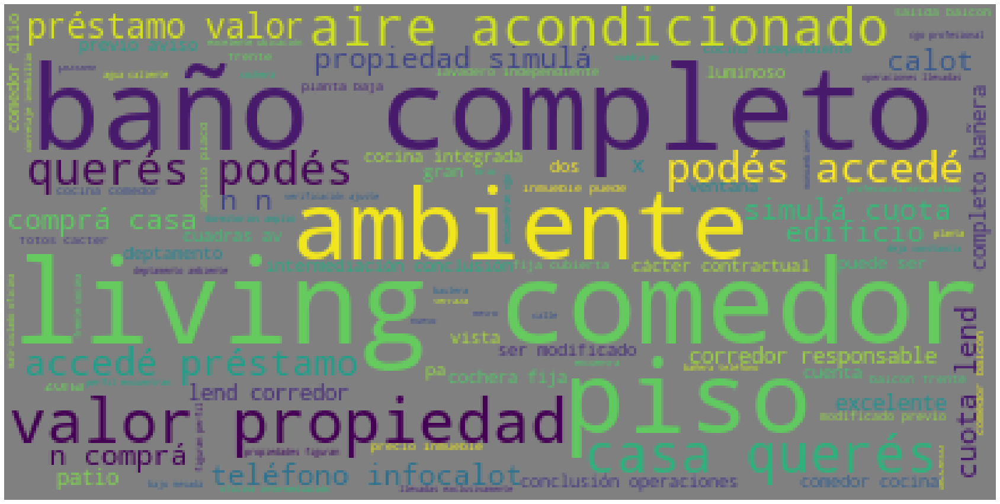

In [ ]:
plt.figure(figsize=(30,20))
wordcloud_venta=WordCloud(max_font_size=250,max_words=200,background_color='grey').generate(' '.join(unigram_venta))
plt.imshow(wordcloud_venta)
plt.axis('off')
plt.show()

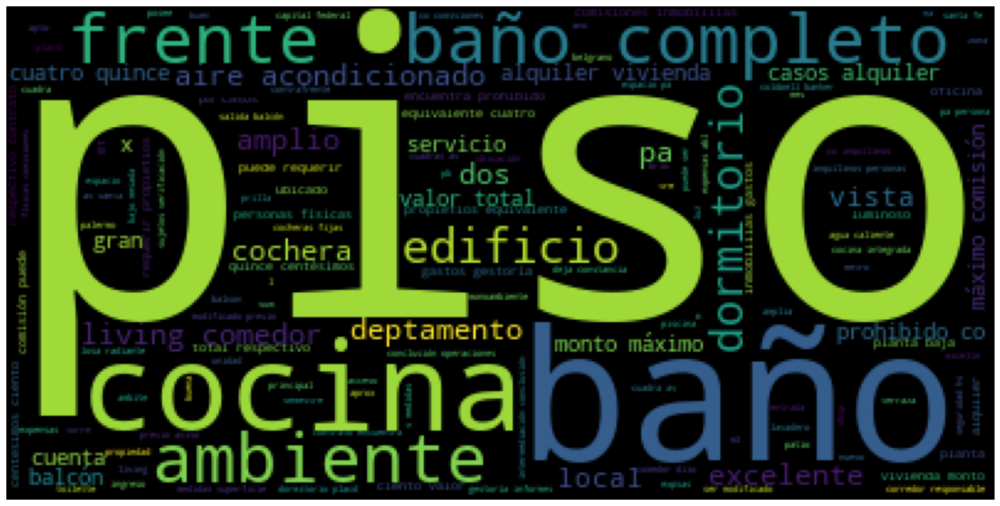

In [ ]:
plt.figure(figsize=(20,10))
wordcloud_alq=WordCloud(max_font_size=250,max_words=200).generate(' '.join(unigram_alquiler))
plt.imshow(wordcloud_alq)
plt.axis('off')
plt.show()

In [ ]:
def search_text(df,word):
    text_search=[]
    for i in df:
        pos=i.find(word)
        text_search.append(pos)
        #if pos>=0:
            #if pos<=ini:
                #text_search.append((ini-pos)*' '+i[:pos+fin])
            #else:
                #text_search.append(i[pos-ini:pos+fin])
    return text_search


In [ ]:
search_text(df=unigram_alquiler,word="subte")

['subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',
 'subte',


## **4. Analisis de Correlacion**

Correlacion

In [ ]:
df.columns

Index(['lat', 'lon', 'Pais', 'Ciudad', 'Barrio', 'ambientes', 'bedrooms',
       'bathrooms', 'surface_total', 'surface_covered', 'price', 'currency',
       'title', 'description', 'property_type', 'operation_type', 'precio_m2',
       'distancia_subte (km)', 'estacion_subte', 'geometry', 'year_s',
       'month_s', 'linea_cercana', 'linea_cercana_val', 'subte_tipo', 'bin'],
      dtype='object')

In [ ]:
df_numerica=df.loc[:,['lat','lon','ambientes', 'bedrooms', 'bathrooms',
       'surface_total', 'surface_covered', 'price', 'precio_m2',
       'distancia_subte (km)']]

In [ ]:
df_numerica.corr()

,lat,lon,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,precio_m2,distancia_subte (km)
lat,1.000000,-0.254240,0.009319,-0.000997,0.105646,0.021019,0.018801,0.264196,0.428639,-0.201392
lon,-0.254240,1.000000,0.010398,0.021122,0.044684,0.025361,0.067321,0.058885,0.017453,-0.531974
ambientes,0.009319,0.010398,1.000000,0.790285,0.377403,0.669719,0.733311,0.535518,0.000882,0.008424
bedrooms,-0.000997,0.021122,0.790285,1.000000,0.338213,0.552585,0.618755,0.409362,-0.008883,-0.004197
bathrooms,0.105646,0.044684,0.377403,0.338213,1.000000,0.539058,0.551168,0.583544,0.268793,-0.021143
surface_total,0.021019,0.025361,0.669719,0.552585,0.539058,1.000000,0.924456,0.779051,0.184688,0.043540
surface_covered,0.018801,0.067321,0.733311,0.618755,0.551168,0.924456,1.000000,0.775472,0.092157,0.020606
price,0.264196,0.058885,0.535518,0.409362,0.583544,0.779051,0.775472,1.000000,0.657971,-0.032187
precio_m2,0.428639,0.017453,0.000882,-0.008883,0.268793,0.184688,0.092157,0.657971,1.000000,-0.083364
distancia_subte (km),-0.201392,-0.531974,0.008424,-0.004197,-0.021143,0.043540,0.020606,-0.032187,-0.083364,1.000000


[Text(0.5, 0, 'lat'),
 Text(1.5, 0, 'lon'),
 Text(2.5, 0, 'ambientes'),
 Text(3.5, 0, 'bedrooms'),
 Text(4.5, 0, 'bathrooms'),
 Text(5.5, 0, 'surface_total'),
 Text(6.5, 0, 'surface_covered'),
 Text(7.5, 0, 'price'),
 Text(8.5, 0, 'precio_m2'),
 Text(9.5, 0, 'distancia_subte (km)')]

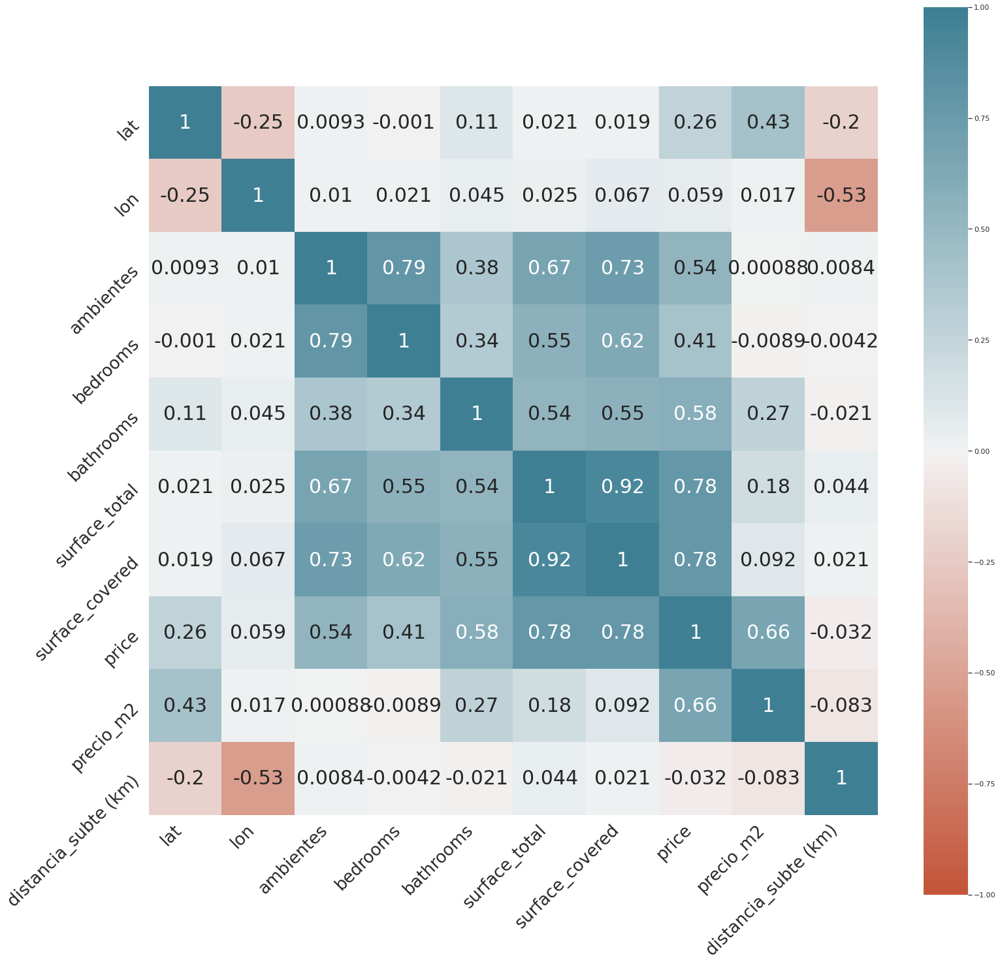

In [ ]:
corr = df_numerica.corr()
fig, ax = plt.subplots(figsize=(25,25)) 
ax = sns.heatmap(
    corr, 
    annot=True,
    annot_kws={"fontsize":30},
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_yticklabels(
        ax.get_yticklabels(),
        fontsize=26,
        rotation=45,
        horizontalalignment='right',
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right',
    fontsize=26
)


[Text(0.5, 0, 'lat'),
 Text(1.5, 0, 'lon'),
 Text(2.5, 0, 'ambientes'),
 Text(3.5, 0, 'bedrooms'),
 Text(4.5, 0, 'bathrooms'),
 Text(5.5, 0, 'surface_total'),
 Text(6.5, 0, 'surface_covered'),
 Text(7.5, 0, 'price'),
 Text(8.5, 0, 'precio_m2'),
 Text(9.5, 0, 'distancia_subte (km)')]

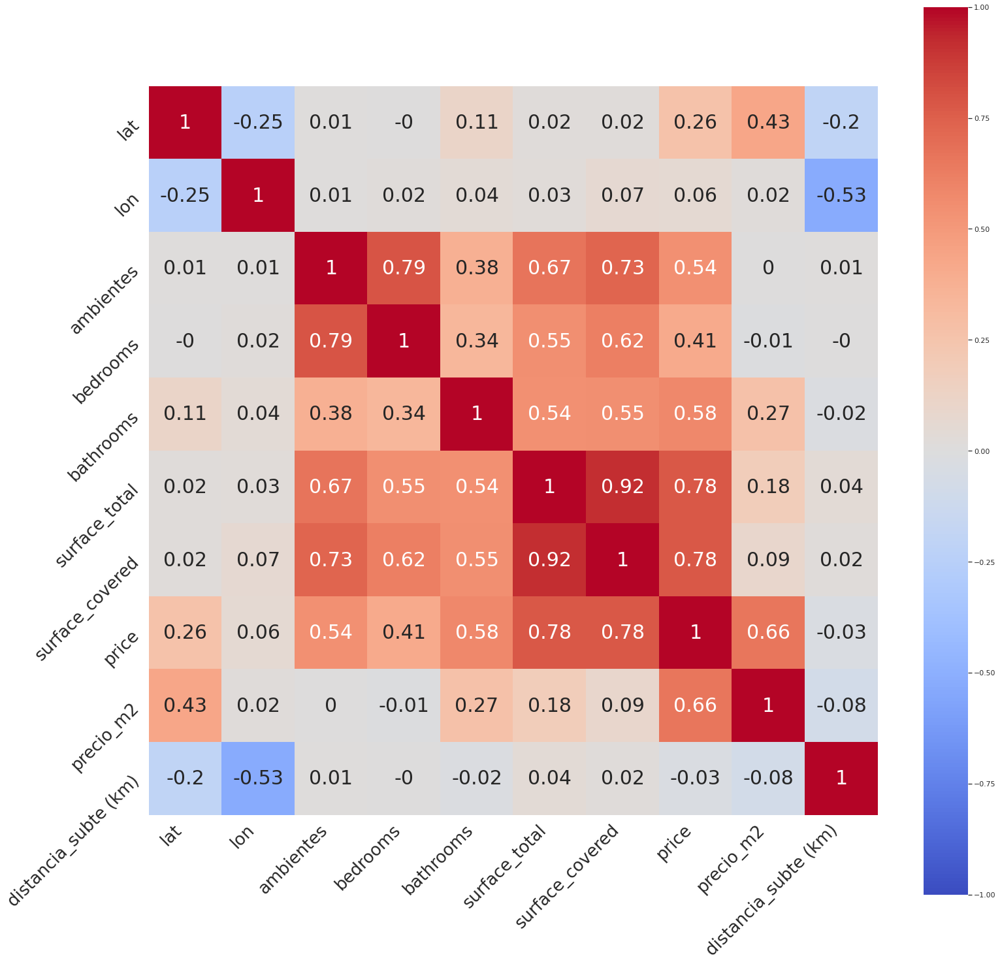

In [ ]:
corr = round(df_numerica.corr(),2)
fig, ax = plt.subplots(figsize=(25,25)) 
ax = sns.heatmap(
    corr, 
    annot=True,
    annot_kws={"fontsize":30},
    vmin=-1, vmax=1, center=0,
    cmap='coolwarm',
    square=True
)
ax.set_yticklabels(
        ax.get_yticklabels(),
        fontsize=26,
        rotation=45,
        horizontalalignment='right',
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right',
    fontsize=26
)

In [ ]:
corr.style.background_gradient(cmap='coolwarm').set_precision(2)

,lat,lon,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,precio_m2,distancia_subte (km)
lat,1.00,-0.25,0.01,-0.00,0.11,0.02,0.02,0.26,0.43,-0.20
lon,-0.25,1.00,0.01,0.02,0.04,0.03,0.07,0.06,0.02,-0.53
ambientes,0.01,0.01,1.00,0.79,0.38,0.67,0.73,0.54,0.00,0.01
bedrooms,-0.00,0.02,0.79,1.00,0.34,0.55,0.62,0.41,-0.01,-0.00
bathrooms,0.11,0.04,0.38,0.34,1.00,0.54,0.55,0.58,0.27,-0.02
surface_total,0.02,0.03,0.67,0.55,0.54,1.00,0.92,0.78,0.18,0.04
surface_covered,0.02,0.07,0.73,0.62,0.55,0.92,1.00,0.78,0.09,0.02
price,0.26,0.06,0.54,0.41,0.58,0.78,0.78,1.00,0.66,-0.03
precio_m2,0.43,0.02,0.00,-0.01,0.27,0.18,0.09,0.66,1.00,-0.08
distancia_subte (km),-0.20,-0.53,0.01,-0.00,-0.02,0.04,0.02,-0.03,-0.08,1.00


Al observar correlacion del precio m2 con lat long: se observa mayor correlacion entre latitud y precio m2 que long y precio m2, pareciera que la ubicaciòn Norte/Sur de la propiedad tiene relacion con el precio del m2 (supongo que mas caro al norte)

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:642: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



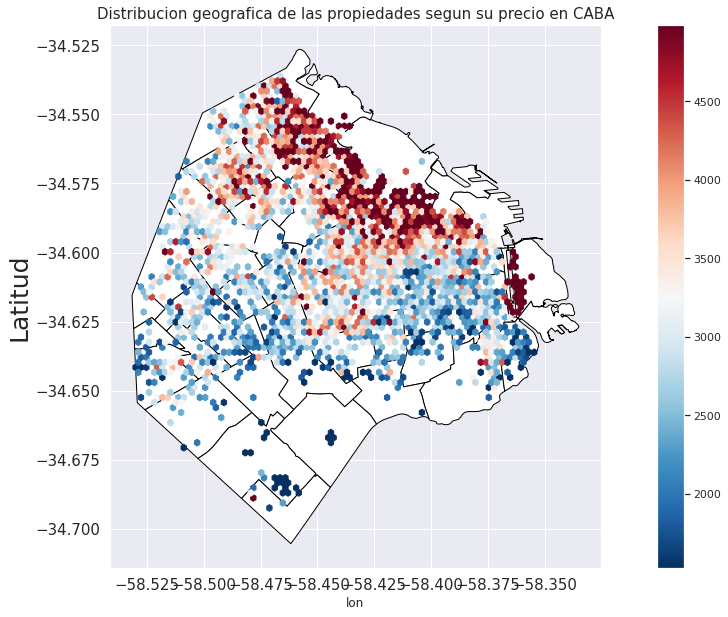

In [ ]:
size= (25,15)
plt.rcParams["figure.figsize"] = size
base=barrios.plot(column='barrio',color='white', edgecolor='black', figsize=(20, 10) )
df.plot.hexbin(x='lon', y='lat', C='precio_m2', reduce_C_function=np.max,gridsize=75,fontsize=15, ax=base, cmap= 'RdBu_r')
plt.title('Distribucion geografica de las propiedades segun su precio en CABA',fontsize=15)
plt.ylabel('Latitud', fontsize=25)
plt.show();

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:642: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



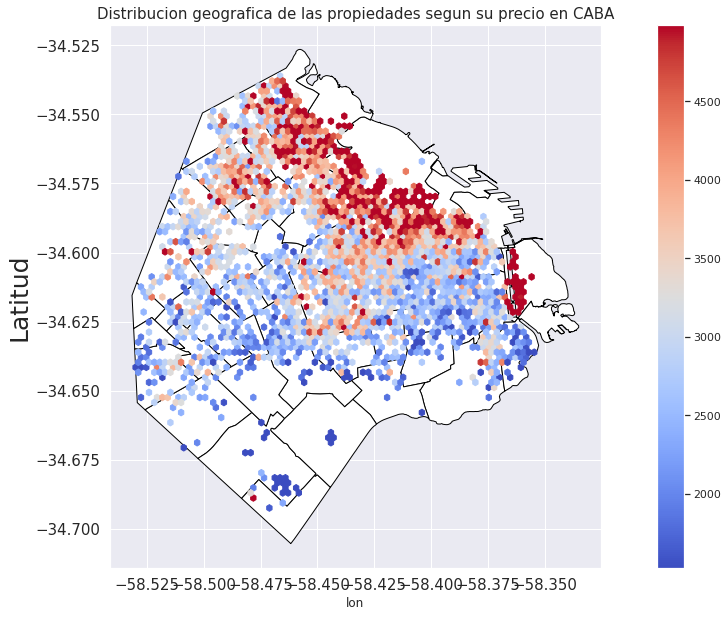

In [ ]:
size= (25,15)
plt.rcParams["figure.figsize"] = size
base=barrios.plot(column='barrio',color='white', edgecolor='black', figsize=(20, 10) )
df.plot.hexbin(x='lon', y='lat', C='precio_m2', reduce_C_function=np.max,gridsize=75,fontsize=15, ax=base, cmap= 'coolwarm')
plt.title('Distribucion geografica de las propiedades segun su precio en CABA',fontsize=15)
plt.ylabel('Latitud', fontsize=25)
plt.show();

In [ ]:
!pip install pingouin

In [ ]:
from scipy import stats
from scipy.stats import pearsonr

In [ ]:
import pingouin as pg

In [ ]:
pg.pairwise_corr(df_numerica).sort_values(by=['Y'])[['X', 'Y', 'n', 'r', 'p-unc']]

,X,Y,n,r,p-unc
1,lat,ambientes,11829,0.009319,3.108589e-01
9,lon,ambientes,11829,0.010398,2.581300e-01
3,lat,bathrooms,11629,0.105646,3.195484e-30
18,ambientes,bathrooms,11629,0.377403,0.000000e+00
24,bedrooms,bathrooms,8869,0.338213,3.183873e-236
11,lon,bathrooms,11629,0.044684,1.431793e-06
17,ambientes,bedrooms,8928,0.790285,0.000000e+00
2,lat,bedrooms,8928,-0.000997,9.249301e-01
10,lon,bedrooms,8928,0.021122,4.595987e-02
43,price,distancia_subte (km),11829,-0.032187,4.631812e-04


In [ ]:
stats.kendalltau(df['distancia_subte (km)'],df['precio_m2'])

KendalltauResult(correlation=0.04786550043942689, pvalue=6.666315892442182e-15)

In [ ]:
stats.spearmanr(df['distancia_subte (km)'],df['precio_m2'])

SpearmanrResult(correlation=0.06970305330612807, pvalue=3.2134429048618913e-14)

In [ ]:
pg.corr(x=df['distancia_subte (km)'], y=df['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,11829,-0.083364,"[-0.1, -0.07]",0.00695,0.006782,1.069958e-19,9.303e+15,1.0


In [ ]:
# Calculate the pairwise Spearman correlation
corr = pg.pairwise_corr(df, columns=['precio_m2', 'distancia_subte (km)'], method='spearman')
# Sort the correlation by p-values and display the first rows
corr.sort_values(by=['p-unc'])[['X', 'Y', 'n', 'r', 'p-unc']]

,X,Y,n,r,p-unc
0,precio_m2,distancia_subte (km),11829,0.069703,3.213443e-14


In [ ]:
from numpy import mean
from numpy import std
from numpy.random import randn
from numpy.random import seed
from matplotlib import pyplot

from scipy.stats import spearmanr

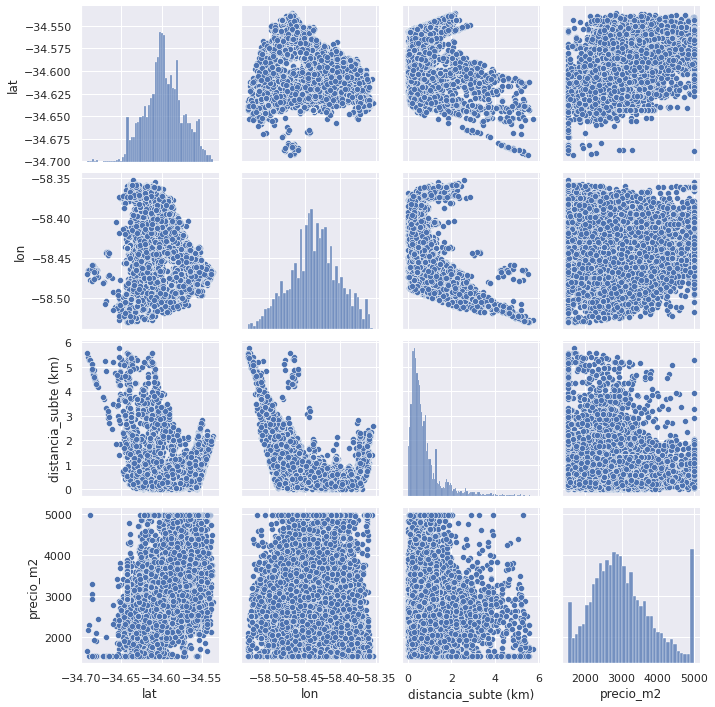

In [ ]:
sns.pairplot(df_numerica.loc[:,('lat','lon', 'distancia_subte (km)', 'precio_m2')])

In [ ]:
df['linea_cercana']=df.estacion_subte.str.split(" - ",expand=True,)[0]

In [ ]:
df['subte_tipo']=df['linea_cercana']

In [ ]:
df.loc[df.linea_cercana.str.startswith('A') | df.linea_cercana.str.startswith('B')| df.linea_cercana.str.startswith('D')| df.linea_cercana.str.startswith('E') , ['subte_tipo']]='norte_sur'
df.loc[df.linea_cercana.str.startswith('C') | df.linea_cercana.str.startswith('H') , ['subte_tipo']]='este_oeste'
       


In [ ]:
df_norte_sur = df.loc[df.subte_tipo =='norte_sur', :]

In [ ]:
df_este_oeste = df.loc[df.subte_tipo =='este_oeste', :]

In [ ]:
df_numerica2=df_norte_sur.loc[:,['lat','lon','ambientes', 'bedrooms', 'bathrooms',
       'surface_total', 'surface_covered', 'price', 'precio_m2',
       'distancia_subte (km)']]

In [ ]:
df_numerica3=df_este_oeste.loc[:,['lat','lon','ambientes', 'bedrooms', 'bathrooms',
       'surface_total', 'surface_covered', 'price', 'precio_m2',
       'distancia_subte (km)']]

In [ ]:
df_numerica2.corr()

,lat,lon,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,precio_m2,distancia_subte (km)
lat,1.000000,-0.171323,-0.002400,-0.004191,0.107395,0.022382,0.021081,0.250630,0.401464,-0.199981
lon,-0.171323,1.000000,0.018981,0.018459,0.059054,0.027860,0.066524,0.103108,0.099973,-0.608704
ambientes,-0.002400,0.018981,1.000000,0.784361,0.377482,0.673149,0.737637,0.537892,0.000268,0.013487
bedrooms,-0.004191,0.018459,0.784361,1.000000,0.334258,0.543236,0.609193,0.403513,-0.005898,-0.004999
bathrooms,0.107395,0.059054,0.377482,0.334258,1.000000,0.534480,0.550814,0.579786,0.277131,-0.023664
surface_total,0.022382,0.027860,0.673149,0.543236,0.534480,1.000000,0.922678,0.777825,0.192288,0.035384
surface_covered,0.021081,0.066524,0.737637,0.609193,0.550814,0.922678,1.000000,0.776525,0.098750,0.013630
price,0.250630,0.103108,0.537892,0.403513,0.579786,0.777825,0.776525,1.000000,0.663947,-0.033834
precio_m2,0.401464,0.099973,0.000268,-0.005898,0.277131,0.192288,0.098750,0.663947,1.000000,-0.080507
distancia_subte (km),-0.199981,-0.608704,0.013487,-0.004999,-0.023664,0.035384,0.013630,-0.033834,-0.080507,1.000000


In [ ]:
df_numerica3.corr()

,lat,lon,ambientes,bedrooms,bathrooms,surface_total,surface_covered,price,precio_m2,distancia_subte (km)
lat,1.000000,-0.356915,0.133890,0.065582,0.094751,0.014165,0.053686,0.365490,0.572402,-0.558194
lon,-0.356915,1.000000,-0.110478,0.021108,-0.002649,0.042750,0.055285,-0.097850,-0.243892,0.555462
ambientes,0.133890,-0.110478,1.000000,0.862861,0.376651,0.643323,0.703173,0.522105,0.005674,-0.058930
bedrooms,0.065582,0.021108,0.862861,1.000000,0.391369,0.663203,0.725115,0.486695,-0.029747,0.032080
bathrooms,0.094751,-0.002649,0.376651,0.391369,1.000000,0.576127,0.558744,0.616877,0.204851,0.001637
surface_total,0.014165,0.042750,0.643323,0.663203,0.576127,1.000000,0.940339,0.793916,0.134645,0.157306
surface_covered,0.053686,0.055285,0.703173,0.725115,0.558744,0.940339,1.000000,0.785581,0.069290,0.127378
price,0.365490,-0.097850,0.522105,0.486695,0.616877,0.793916,0.785581,1.000000,0.607756,-0.055760
precio_m2,0.572402,-0.243892,0.005674,-0.029747,0.204851,0.134645,0.069290,0.607756,1.000000,-0.243399
distancia_subte (km),-0.558194,0.555462,-0.058930,0.032080,0.001637,0.157306,0.127378,-0.055760,-0.243399,1.000000


In [ ]:
pg.corr(x=df.loc[df.linea_cercana =='A',:]['distancia_subte (km)'], y=df.loc[df.linea_cercana =='A',:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,2104,-0.073459,"[-0.12, -0.03]",0.005396,0.004449,0.000746,8.015,0.921313


In [ ]:
stats.kendalltau(df.loc[df.linea_cercana =='A',:]['distancia_subte (km)'], df.loc[df.linea_cercana =='A',:]['precio_m2'])

KendalltauResult(correlation=0.04182112294334414, pvalue=0.004159273575972688)

In [ ]:
stats.spearmanr(df.loc[df.linea_cercana =='A',:]['distancia_subte (km)'], df.loc[df.linea_cercana =='A',:]['precio_m2'])

SpearmanrResult(correlation=0.05878619866235725, pvalue=0.0069921741512687045)

In [ ]:
pg.corr(x=df.loc[df.linea_cercana =='B',:]['distancia_subte (km)'], y=df.loc[df.linea_cercana =='B',:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,4164,0.044392,"[0.01, 0.07]",0.001971,0.001491,0.004168,1.176,0.81748


In [ ]:
stats.kendalltau(df.loc[df.linea_cercana =='B',:]['distancia_subte (km)'], df.loc[df.linea_cercana =='B',:]['precio_m2'])

KendalltauResult(correlation=0.0691500105778498, pvalue=2.4567253699149322e-11)

In [ ]:
stats.spearmanr(df.loc[df.linea_cercana =='B',:]['distancia_subte (km)'], df.loc[df.linea_cercana =='B',:]['precio_m2'])

SpearmanrResult(correlation=0.10448099216975536, pvalue=1.393888584021253e-11)

In [ ]:
pg.corr(x=df.loc[df.linea_cercana =='C',:]['distancia_subte (km)'], y=df.loc[df.linea_cercana =='C',:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,560,-0.294913,"[-0.37, -0.22]",0.086974,0.083695,1.061214e-12,5.125e+09,1.0


In [ ]:
stats.kendalltau(df.loc[df.linea_cercana =='C',:]['distancia_subte (km)'], df.loc[df.linea_cercana =='C',:]['precio_m2'])

KendalltauResult(correlation=-0.1999293100253058, pvalue=2.081519813535206e-12)

In [ ]:
stats.spearmanr(df.loc[df.linea_cercana =='C',:]['distancia_subte (km)'], df.loc[df.linea_cercana =='C',:]['precio_m2'])

SpearmanrResult(correlation=-0.29943365182041376, pvalue=4.595412995649103e-13)

In [ ]:
pg.corr(x=df.loc[df.linea_cercana =='D',:]['distancia_subte (km)'], y=df.loc[df.linea_cercana =='D',:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,3462,0.084484,"[0.05, 0.12]",0.007138,0.006563,6.423488e-07,5094.632,0.998742


In [ ]:
stats.spearmanr(df.loc[df.linea_cercana =='D',:]['distancia_subte (km)'], df.loc[df.linea_cercana =='D',:]['precio_m2'])

SpearmanrResult(correlation=0.15447308567332352, pvalue=6.208550145298757e-20)

In [ ]:
stats.kendalltau(df.loc[df.linea_cercana =='D',:]['distancia_subte (km)'], df.loc[df.linea_cercana =='D',:]['precio_m2'])

KendalltauResult(correlation=0.10543273766611204, pvalue=2.3099277147237362e-20)

In [ ]:
pg.corr(x=df.loc[df.linea_cercana =='E',:]['distancia_subte (km)'], y=df.loc[df.linea_cercana =='E',:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,926,-0.108724,"[-0.17, -0.04]",0.011821,0.00968,0.00092,9.895,0.912754


In [ ]:
pg.corr(x=df.loc[df.linea_cercana =='H',:]['distancia_subte (km)'], y=df.loc[df.linea_cercana =='H',:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,613,0.100293,"[0.02, 0.18]",0.010059,0.006813,0.012979,1.099,0.700994


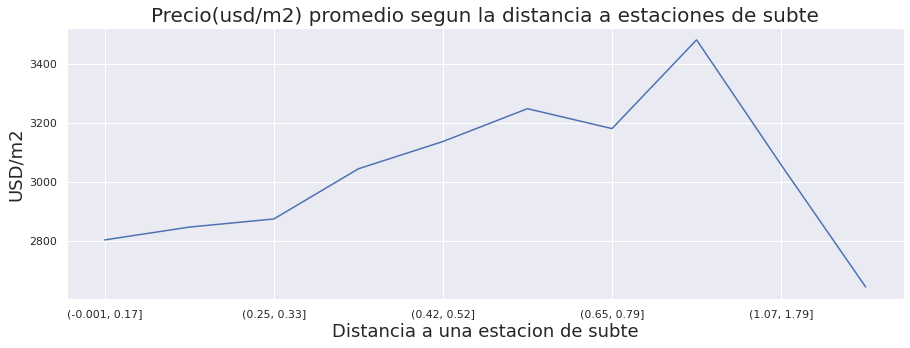

In [ ]:
df['bin'] = pd.qcut(round(df['distancia_subte (km)'],2), 10)
graph = df.groupby('bin').mean()['precio_m2'].plot(figsize=(15,5),color='b')
graph.set_title("Precio(usd/m2) promedio segun la distancia a estaciones de subte", fontsize=20)
graph.set_xlabel("Distancia a una estacion de subte", fontsize=18)
graph.set_ylabel("USD/m2", fontsize=18)
plt.show()

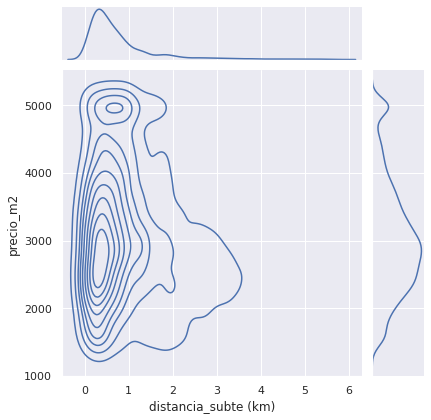

In [ ]:
sns.jointplot(x = 'distancia_subte (km)', y="precio_m2", data=df, kind = 'kde')

In [ ]:
#palette_={'A':'#0597F2', 
#          'B':'red',
#          'C':'#0540F2',
#          'D':'#02732A',
#          'E':'purple',
#          'H':'#F2E205'}
#nUEVA PALETA CORREGIDA
palette_={'A':'#3287B6', 
          'B':'#BF1534',
          'C':'#015A8F',
          'D':'#077354',
          'E':'#5E1473',
          'H':'#E4C123'}

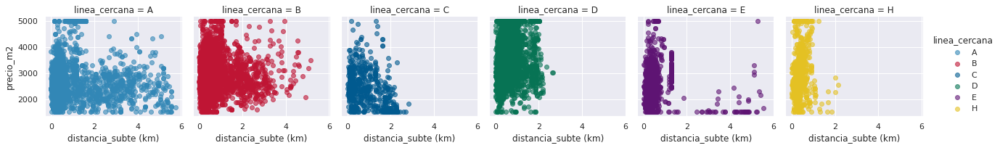

In [ ]:
sns.FacetGrid(df.sort_values(by='linea_cercana'), col = "linea_cercana", hue="linea_cercana", palette=palette_).map(plt.scatter, 'distancia_subte (km)', "precio_m2", alpha =0.6).add_legend()

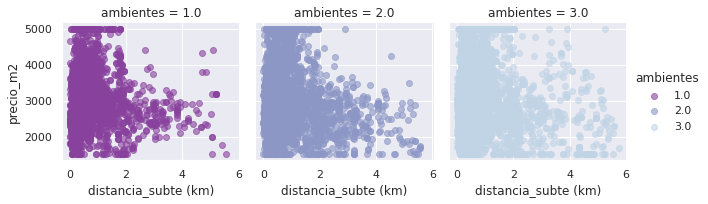

In [ ]:
sns.FacetGrid(df.sort_values(by='ambientes'), col = "ambientes", hue="ambientes", palette='BuPu_r').map(plt.scatter, 'distancia_subte (km)', "precio_m2", alpha =0.6).add_legend()

In [ ]:
pale_={'norte_sur':'#77ACD0', 
       'este_oeste': '#FF7F0E'
}

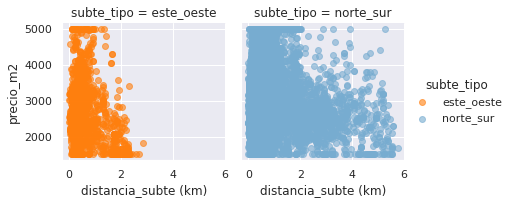

In [ ]:
sns.FacetGrid(df.sort_values(by='subte_tipo'), col = "subte_tipo", hue="subte_tipo", palette=pale_).map(plt.scatter, 'distancia_subte (km)', "precio_m2", alpha =0.6).add_legend()


In [ ]:
pg.corr(x=df.loc[df.subte_tipo =='norte_sur',:]['distancia_subte (km)'], y=df.loc[df.subte_tipo =='norte_sur',:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,10656,-0.080507,"[-0.1, -0.06]",0.006481,0.006295,8.565607e-17,1.333e+13,1.0


In [ ]:
pg.corr(x=df.loc[df.subte_tipo =='este_oeste',:]['distancia_subte (km)'], y=df.loc[df.subte_tipo =='este_oeste',:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,1173,-0.243399,"[-0.3, -0.19]",0.059243,0.057635,2.796423e-17,1.164e+14,1.0


In [ ]:
pg.corr(x=df.loc[df.ambientes ==1,:]['distancia_subte (km)'], y=df.loc[df.ambientes ==1,:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,3092,-0.060085,"[-0.1, -0.02]",0.00361,0.002965,0.00083,5.999,0.916821


In [ ]:
pg.corr(x=df.loc[df.ambientes ==2,:]['distancia_subte (km)'], y=df.loc[df.ambientes ==2,:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,4564,-0.127041,"[-0.16, -0.1]",0.016139,0.015708,6.985041e-18,2.398e+14,1.0


In [ ]:
pg.corr(x=df.loc[df.ambientes ==3,:]['distancia_subte (km)'], y=df.loc[df.ambientes ==3,:]['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,4173,-0.053976,"[-0.08, -0.02]",0.002913,0.002435,0.000486,8.495,0.936914


In [ ]:
df_test=df.loc[df.linea_cercana.isin(['B','D']),:]

In [ ]:
pg.corr(x=df_test['distancia_subte (km)'], y=df_test['precio_m2'])

,n,r,CI95%,r2,adj_r2,p-val,BF10,power
pearson,7626,0.00619,"[-0.02, 0.03]",0.000038,-0.000224,0.588881,0.017,0.084078


In [ ]:
stats.spearmanr(df_test['distancia_subte (km)'], df_test['precio_m2'])

SpearmanrResult(correlation=0.09277056440648537, pvalue=4.756717588229818e-16)

In [ ]:
stats.kendalltau(df_test['distancia_subte (km)'], df_test['precio_m2'])

KendalltauResult(correlation=0.06212504358098042, pvalue=4.791069015304994e-16)